In [1]:
import os
from os import listdir
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import plotly.express as px
import seaborn as sns

import cv2
from matplotlib.image import imread

#import tensorflow as tf
#from keras.utils.np_utils import to_categorical
#from keras.preprocessing import image
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix


import glob
import PIL
import random

random.seed(100)

In [2]:
image_dir = "/scratch/xxsi3290/Kaggle/jpeg/jpeg/"

In [3]:
dicom_data = pd.read_csv('/scratch/xxsi3290/Kaggle/dicom_info.csv')
dicom_data.head()

,file_path,image_path,AccessionNumber,BitsAllocated,BitsStored,BodyPartExamined,Columns,ContentDate,ContentTime,ConversionType,...,SecondaryCaptureDeviceManufacturerModelName,SeriesDescription,SeriesInstanceUID,SeriesNumber,SmallestImagePixelValue,SpecificCharacterSet,StudyDate,StudyID,StudyInstanceUID,StudyTime
0,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.12930...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.129308...,NaN,16,16,BREAST,351,20160426,131732.685,WSD,...,MATLAB,cropped images,1.3.6.1.4.1.9590.100.1.2.129308726812851964007...,1,23078,ISO_IR 100,20160720.0,DDSM,1.3.6.1.4.1.9590.100.1.2.271867287611061855725...,214951.0
1,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.24838...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.248386...,NaN,16,16,BREAST,3526,20160426,143829.101,WSD,...,MATLAB,full mammogram images,1.3.6.1.4.1.9590.100.1.2.248386742010678582309...,1,0,ISO_IR 100,20160720.0,DDSM,1.3.6.1.4.1.9590.100.1.2.161516517311681906612...,193426.0
2,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.26721...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.267213...,NaN,16,16,BREAST,1546,20160503,111956.298,WSD,...,MATLAB,full mammogram images,1.3.6.1.4.1.9590.100.1.2.267213171011171858918...,1,0,ISO_IR 100,20160807.0,DDSM,1.3.6.1.4.1.9590.100.1.2.291043622711253836701...,161814.0
3,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.38118...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...,NaN,16,16,BREAST,97,20160503,115347.770,WSD,...,MATLAB,cropped images,1.3.6.1.4.1.9590.100.1.2.381187369611524586537...,1,32298,ISO_IR 100,20170829.0,DDSM,1.3.6.1.4.1.9590.100.1.2.335006093711888937440...,180109.0
4,CBIS-DDSM/dicom/1.3.6.1.4.1.9590.100.1.2.38118...,CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...,NaN,8,8,Left Breast,3104,20160503,115347.770,WSD,...,MATLAB,NaN,1.3.6.1.4.1.9590.100.1.2.381187369611524586537...,1,0,ISO_IR 100,NaN,DDSM,1.3.6.1.4.1.9590.100.1.2.335006093711888937440...,NaN


In [4]:
dicom_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10237 entries, 0 to 10236
Data columns (total 38 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   file_path                                    10237 non-null  object 
 1   image_path                                   10237 non-null  object 
 2   AccessionNumber                              0 non-null      float64
 3   BitsAllocated                                10237 non-null  int64  
 4   BitsStored                                   10237 non-null  int64  
 5   BodyPartExamined                             10237 non-null  object 
 6   Columns                                      10237 non-null  int64  
 7   ContentDate                                  10237 non-null  int64  
 8   ContentTime                                  10237 non-null  float64
 9   ConversionType                               10237 non-null  object 
 10

In [5]:
# check image types in dataset
dicom_data.SeriesDescription.unique()

array(['cropped images', 'full mammogram images', nan, 'ROI mask images'],
      dtype=object)

In [6]:
meta_data = pd.read_csv('/scratch/xxsi3290/Kaggle/meta.csv')
meta_data.head()

,SeriesInstanceUID,StudyInstanceUID,Modality,SeriesDescription,BodyPartExamined,SeriesNumber,Collection,Visibility,ImageCount
0,1.3.6.1.4.1.9590.100.1.2.117041576511324414842...,1.3.6.1.4.1.9590.100.1.2.229361142710768138411...,MG,ROI mask images,BREAST,1,CBIS-DDSM,1,2
1,1.3.6.1.4.1.9590.100.1.2.438738396107617880132...,1.3.6.1.4.1.9590.100.1.2.195593486612988388325...,MG,ROI mask images,BREAST,1,CBIS-DDSM,1,2
2,1.3.6.1.4.1.9590.100.1.2.767416741131676463382...,1.3.6.1.4.1.9590.100.1.2.257901172612530623323...,MG,ROI mask images,BREAST,1,CBIS-DDSM,1,2
3,1.3.6.1.4.1.9590.100.1.2.296931352612305599800...,1.3.6.1.4.1.9590.100.1.2.109468616710242115222...,MG,ROI mask images,BREAST,1,CBIS-DDSM,1,2
4,1.3.6.1.4.1.9590.100.1.2.436657670120353100077...,1.3.6.1.4.1.9590.100.1.2.380627129513562450304...,MG,ROI mask images,BREAST,1,CBIS-DDSM,1,2


In [7]:
meta_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6775 entries, 0 to 6774
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   SeriesInstanceUID  6775 non-null   object
 1   StudyInstanceUID   6775 non-null   object
 2   Modality           6775 non-null   object
 3   SeriesDescription  6775 non-null   object
 4   BodyPartExamined   6775 non-null   object
 5   SeriesNumber       6775 non-null   int64 
 6   Collection         6775 non-null   object
 7   Visibility         6775 non-null   int64 
 8   ImageCount         6775 non-null   int64 
dtypes: int64(3), object(6)
memory usage: 476.5+ KB


In [8]:
cropped_images = dicom_data[dicom_data.SeriesDescription == 'cropped images'].image_path
cropped_images.head()

0     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.129308...
3     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...
6     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.153339...
7     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.178994...
10    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.411833...
Name: image_path, dtype: object

In [9]:
full_mammogram_images = dicom_data[dicom_data.SeriesDescription == 'full mammogram images'].image_path
full_mammogram_images.head()

1     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.248386...
2     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.267213...
11    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.210396...
12    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.749566...
15    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.987658...
Name: image_path, dtype: object

In [10]:
ROI_mask_images = dicom_data[dicom_data.SeriesDescription == 'ROI mask images'].image_path
ROI_mask_images.head()

5     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.153339...
8     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.178994...
9     CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.411833...
14    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.236373...
20    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.357008...
Name: image_path, dtype: object

In [11]:
#cropped_images = cropped_images.apply(lambda x: x.replace('CBIS-DDSM/jpeg/', image_dir, regex=True))
cropped_images = cropped_images.replace('CBIS-DDSM/jpeg/', image_dir, regex=True)
#cropped_images.head()

full_mammogram_images = full_mammogram_images.replace('CBIS-DDSM/jpeg/', image_dir, regex=True)
#full_mammogram_images.head()

ROI_mask_images = ROI_mask_images.replace('CBIS-DDSM/jpeg/', image_dir, regex=True)
#ROI_mask_images.head()

# view new paths
print('Cropped Images paths:\n')
print(cropped_images.iloc[0])
print('Full mammo Images paths:\n')
print(full_mammogram_images.iloc[0])
print('ROI Mask Images paths:\n')
print(ROI_mask_images.iloc[0])

Cropped Images paths:

/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.129308726812851964007517874181459556304/1-172.jpg
Full mammo Images paths:

/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.248386742010678582309005372213277814849/1-249.jpg
ROI Mask Images paths:

/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.153339052913121382622526066491844156138/2-270.jpg


In [12]:
# organize image paths
full_mammo_dict = dict()
cropped_images_dict = dict()
roi_img_dict = dict()

for dicom in full_mammogram_images:
    key = dicom.split("/")[6]
    full_mammo_dict[key] = dicom
for dicom in cropped_images:
    key = dicom.split("/")[6]
    cropped_images_dict[key] = dicom
for dicom in ROI_mask_images:
    key = dicom.split("/")[6]
    roi_img_dict[key] = dicom

# view keys
next(iter((full_mammo_dict.items())))

('1.3.6.1.4.1.9590.100.1.2.248386742010678582309005372213277814849',
 '/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.248386742010678582309005372213277814849/1-249.jpg')

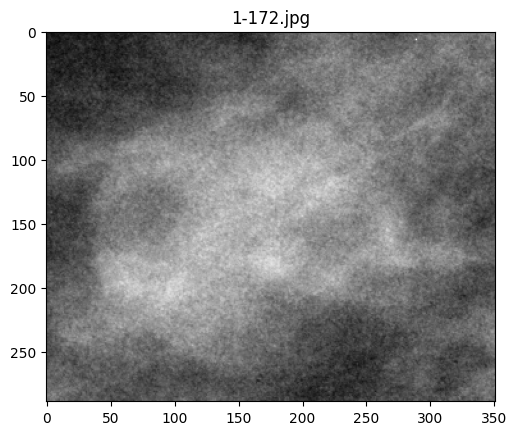

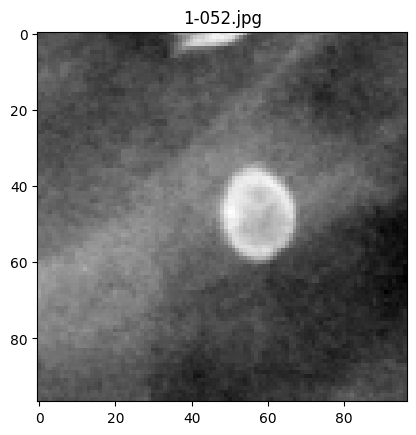

File not found: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.153339052913121382622526066491844156138/1-034.jpg


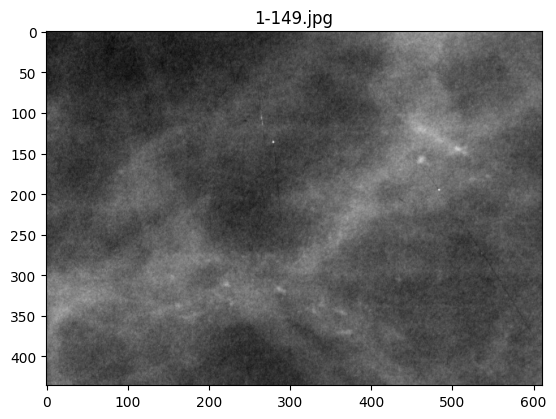

File not found: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.411833492612373627114350673042828631265/1-003.jpg
File not found: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.236373548712994183418851990043419770402/1-085.jpg


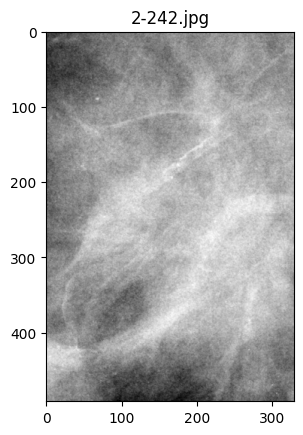

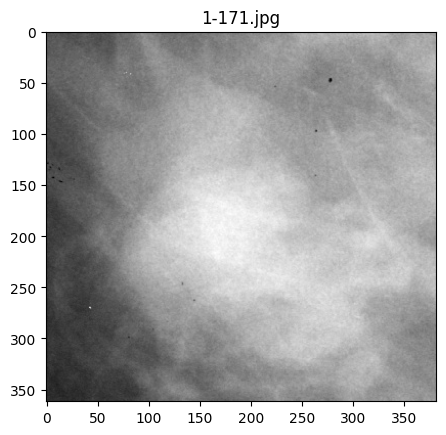

File not found: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.281604745510897859806968805740602385667/1-111.jpg


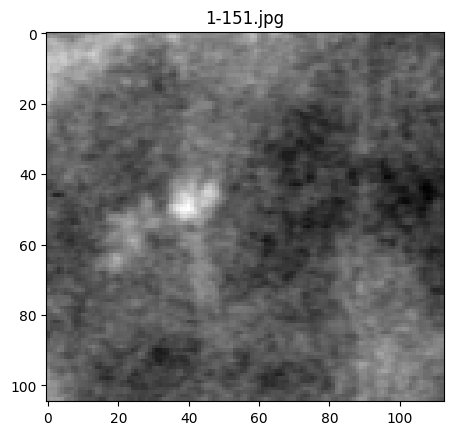

In [13]:
import matplotlib.pyplot as plt 
import glob
import PIL
import random

for file in cropped_images[0:10]:
    try:
        if not os.path.exists(file):
            print(f"File not found: {file}")
            continue  # Skip to the next file
        cropped_images_show = PIL.Image.open(file)
        gray_img = cropped_images_show.convert("L")
        plt.imshow(gray_img, cmap='gray')
        plt.title(os.path.basename(file))
        plt.show()
    except Exception as e:
        print(f"Error loading {file}: {e}")
        continue

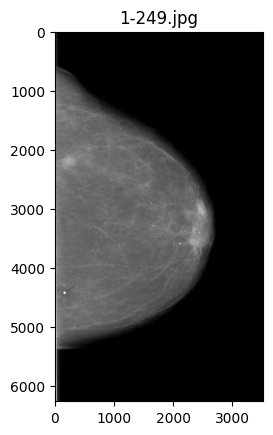

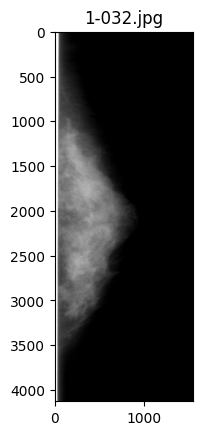

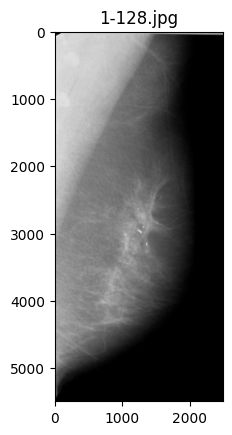

File not found: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.74956658311383957201426978750903861062/1-248.jpg


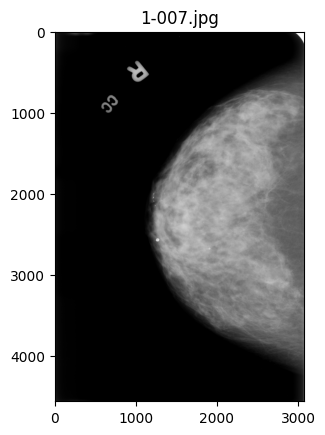

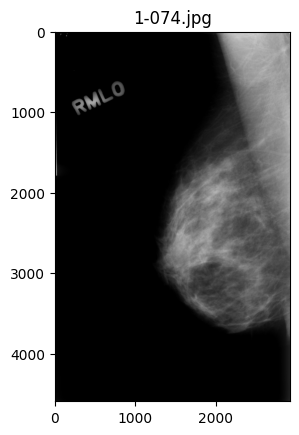

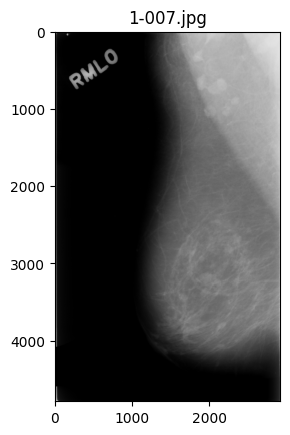

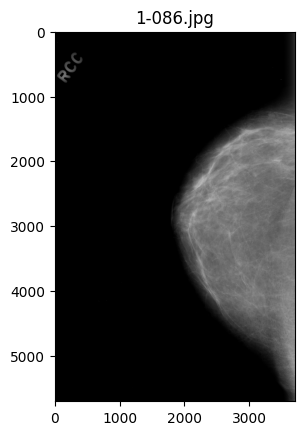

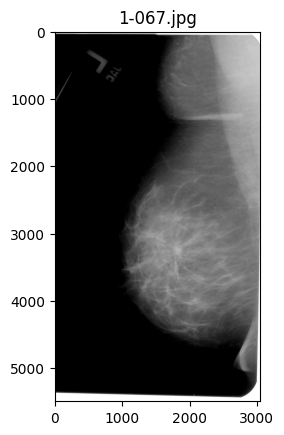

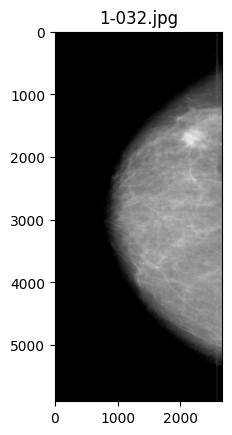

In [14]:
import os
import PIL
import matplotlib.pyplot as plt

for file  in full_mammogram_images[0:10]:
    try:
        if not os.path.exists(file):
            print(f"File not found: {file}")
            continue
        full_mammogram_images_show = PIL.Image.open(file)
        gray_img= full_mammogram_images_show.convert("L")
        plt.imshow(gray_img, cmap='gray')
        plt.title(os.path.basename(file))
        plt.show()
    except Exception as e:
        print(f"Error loading {file}: {e}")
        continue

File not found: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.153339052913121382622526066491844156138/2-270.jpg


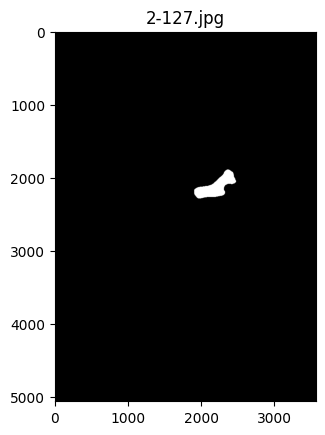

File not found: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.411833492612373627114350673042828631265/2-281.jpg
File not found: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.236373548712994183418851990043419770402/2-086.jpg


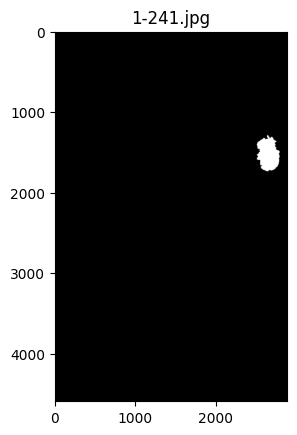

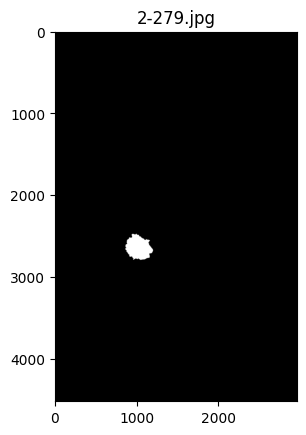

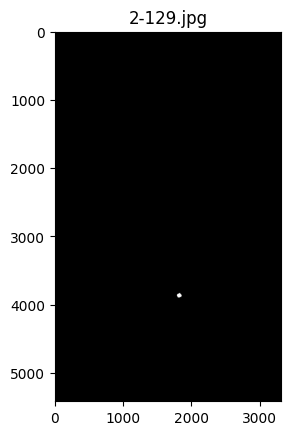

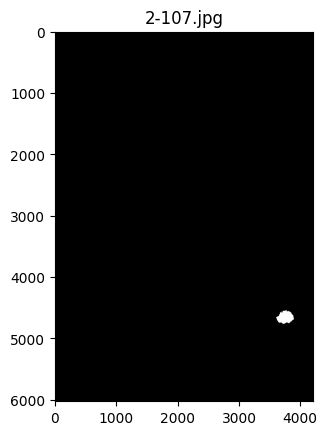

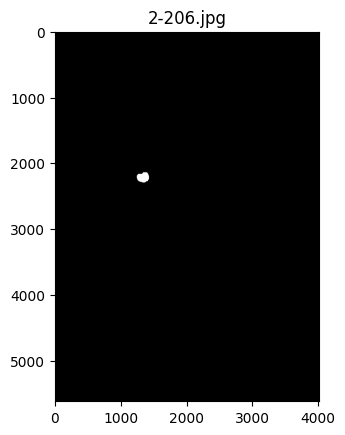

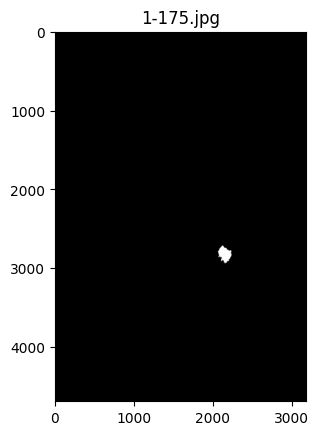

In [15]:
import os
import PIL
import matplotlib.pyplot as plt

for file in ROI_mask_images[0:10]:
    try:
        if not os.path.exists(file):  
            print(f"File not found: {file}")
            continue
        ROI_mask_images_show = PIL.Image.open(file)
        gray_img = ROI_mask_images_show.convert("L")
        plt.imshow(gray_img, cmap='gray')
        plt.title(os.path.basename(file))
        plt.show()
    except Exception as e:
        print(f"Error loading {file}: {e}")
        continue


In [16]:
calc_train_df = pd.read_csv('/scratch/xxsi3290/Kaggle/calc_case_description_train_set.csv')
calc_test_df = pd.read_csv('/scratch/xxsi3290/Kaggle/calc_case_description_test_set.csv')

calc_train_df.head()

,patient_id,breast density,left or right breast,image view,abnormality id,abnormality type,calc type,calc distribution,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path
0,P_00005,3,RIGHT,CC,1,calcification,AMORPHOUS,CLUSTERED,3,MALIGNANT,3,Calc-Training_P_00005_RIGHT_CC/1.3.6.1.4.1.959...,Calc-Training_P_00005_RIGHT_CC_1/1.3.6.1.4.1.9...,Calc-Training_P_00005_RIGHT_CC_1/1.3.6.1.4.1.9...
1,P_00005,3,RIGHT,MLO,1,calcification,AMORPHOUS,CLUSTERED,3,MALIGNANT,3,Calc-Training_P_00005_RIGHT_MLO/1.3.6.1.4.1.95...,Calc-Training_P_00005_RIGHT_MLO_1/1.3.6.1.4.1....,Calc-Training_P_00005_RIGHT_MLO_1/1.3.6.1.4.1....
2,P_00007,4,LEFT,CC,1,calcification,PLEOMORPHIC,LINEAR,4,BENIGN,4,Calc-Training_P_00007_LEFT_CC/1.3.6.1.4.1.9590...,Calc-Training_P_00007_LEFT_CC_1/1.3.6.1.4.1.95...,Calc-Training_P_00007_LEFT_CC_1/1.3.6.1.4.1.95...
3,P_00007,4,LEFT,MLO,1,calcification,PLEOMORPHIC,LINEAR,4,BENIGN,4,Calc-Training_P_00007_LEFT_MLO/1.3.6.1.4.1.959...,Calc-Training_P_00007_LEFT_MLO_1/1.3.6.1.4.1.9...,Calc-Training_P_00007_LEFT_MLO_1/1.3.6.1.4.1.9...
4,P_00008,1,LEFT,CC,1,calcification,NaN,REGIONAL,2,BENIGN_WITHOUT_CALLBACK,3,Calc-Training_P_00008_LEFT_CC/1.3.6.1.4.1.9590...,Calc-Training_P_00008_LEFT_CC_1/1.3.6.1.4.1.95...,Calc-Training_P_00008_LEFT_CC_1/1.3.6.1.4.1.95...


In [17]:
def fix_image_path_calc(dataset):
    for i, img in enumerate(dataset.values):
        img_name = img[11].split("/")[2]
        if img_name in full_mammo_dict:
            dataset.iloc[i, 11] = full_mammo_dict[img_name]

        img_name = img[12].split("/")[2]
        if img_name in cropped_images_dict:
            dataset.iloc[i, 12] = cropped_images_dict[img_name]
        
        img_name = img[13].split("/")[2]
        if img_name in roi_img_dict:
            dataset.iloc[i, 13] = roi_img_dict[img_name]

fix_image_path_calc(calc_train_df)
fix_image_path_calc(calc_test_df)

In [18]:
# check unique values in pathology column
calc_train_df.pathology.unique()

array(['MALIGNANT', 'BENIGN', 'BENIGN_WITHOUT_CALLBACK'], dtype=object)

In [19]:
mass_train_df = pd.read_csv('/scratch/xxsi3290/Kaggle/mass_case_description_train_set.csv')
mass_test_df = pd.read_csv('/scratch/xxsi3290/Kaggle/mass_case_description_test_set.csv')

mass_train_df.head()

,patient_id,breast_density,left or right breast,image view,abnormality id,abnormality type,mass shape,mass margins,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path
0,P_00001,3,LEFT,CC,1,mass,IRREGULAR-ARCHITECTURAL_DISTORTION,SPICULATED,4,MALIGNANT,4,Mass-Training_P_00001_LEFT_CC/1.3.6.1.4.1.9590...,Mass-Training_P_00001_LEFT_CC_1/1.3.6.1.4.1.95...,Mass-Training_P_00001_LEFT_CC_1/1.3.6.1.4.1.95...
1,P_00001,3,LEFT,MLO,1,mass,IRREGULAR-ARCHITECTURAL_DISTORTION,SPICULATED,4,MALIGNANT,4,Mass-Training_P_00001_LEFT_MLO/1.3.6.1.4.1.959...,Mass-Training_P_00001_LEFT_MLO_1/1.3.6.1.4.1.9...,Mass-Training_P_00001_LEFT_MLO_1/1.3.6.1.4.1.9...
2,P_00004,3,LEFT,CC,1,mass,ARCHITECTURAL_DISTORTION,ILL_DEFINED,4,BENIGN,3,Mass-Training_P_00004_LEFT_CC/1.3.6.1.4.1.9590...,Mass-Training_P_00004_LEFT_CC_1/1.3.6.1.4.1.95...,Mass-Training_P_00004_LEFT_CC_1/1.3.6.1.4.1.95...
3,P_00004,3,LEFT,MLO,1,mass,ARCHITECTURAL_DISTORTION,ILL_DEFINED,4,BENIGN,3,Mass-Training_P_00004_LEFT_MLO/1.3.6.1.4.1.959...,Mass-Training_P_00004_LEFT_MLO_1/1.3.6.1.4.1.9...,Mass-Training_P_00004_LEFT_MLO_1/1.3.6.1.4.1.9...
4,P_00004,3,RIGHT,MLO,1,mass,OVAL,CIRCUMSCRIBED,4,BENIGN,5,Mass-Training_P_00004_RIGHT_MLO/1.3.6.1.4.1.95...,Mass-Training_P_00004_RIGHT_MLO_1/1.3.6.1.4.1....,Mass-Training_P_00004_RIGHT_MLO_1/1.3.6.1.4.1....


In [20]:
def fix_image_path_mass(dataset):
    for i, img in enumerate(dataset.values):
        img_name = img[11].split("/")[2]
        if img_name in full_mammo_dict:
            dataset.iloc[i, 11] = full_mammo_dict[img_name]

        img_name = img[12].split("/")[2]
        if img_name in cropped_images_dict:
            dataset.iloc[i, 12] = cropped_images_dict[img_name]
        
        img_name = img[13].split("/")[2]
        if img_name in roi_img_dict:
            dataset.iloc[i, 13] = roi_img_dict[img_name]

fix_image_path_mass(mass_train_df)
fix_image_path_mass(mass_test_df)

In [21]:
mass_train_df.pathology.unique()

array(['MALIGNANT', 'BENIGN', 'BENIGN_WITHOUT_CALLBACK'], dtype=object)

In [22]:
mass_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1318 entries, 0 to 1317
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   patient_id               1318 non-null   object
 1   breast_density           1318 non-null   int64 
 2   left or right breast     1318 non-null   object
 3   image view               1318 non-null   object
 4   abnormality id           1318 non-null   int64 
 5   abnormality type         1318 non-null   object
 6   mass shape               1314 non-null   object
 7   mass margins             1275 non-null   object
 8   assessment               1318 non-null   int64 
 9   pathology                1318 non-null   object
 10  subtlety                 1318 non-null   int64 
 11  image file path          1318 non-null   object
 12  cropped image file path  1318 non-null   object
 13  ROI mask file path       1318 non-null   object
dtypes: int64(4), object(10)
memory usage: 14

In [23]:
# rename columns
mass_train_df = mass_train_df.rename(columns={'left or right breast': 'left_or_right_breast',
                                           'image view': 'image_view',
                                           'abnormality id': 'abnormality_id',
                                           'abnormality type': 'abnormality_type',
                                           'mass shape': 'mass_shape',
                                           'mass margins': 'mass_margins',
                                           'image file path': 'image_file_path',
                                           'cropped image file path': 'cropped_image_file_path',
                                           'ROI mask file path': 'ROI_mask_file_path'})

mass_train_df.head(5)

,patient_id,breast_density,left_or_right_breast,image_view,abnormality_id,abnormality_type,mass_shape,mass_margins,assessment,pathology,subtlety,image_file_path,cropped_image_file_path,ROI_mask_file_path
0,P_00001,3,LEFT,CC,1,mass,IRREGULAR-ARCHITECTURAL_DISTORTION,SPICULATED,4,MALIGNANT,4,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...
1,P_00001,3,LEFT,MLO,1,mass,IRREGULAR-ARCHITECTURAL_DISTORTION,SPICULATED,4,MALIGNANT,4,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...
2,P_00004,3,LEFT,CC,1,mass,ARCHITECTURAL_DISTORTION,ILL_DEFINED,4,BENIGN,3,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...
3,P_00004,3,LEFT,MLO,1,mass,ARCHITECTURAL_DISTORTION,ILL_DEFINED,4,BENIGN,3,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...
4,P_00004,3,RIGHT,MLO,1,mass,OVAL,CIRCUMSCRIBED,4,BENIGN,5,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...


In [24]:
# check for null values
mass_train_df.isnull().sum()

patient_id                  0
breast_density              0
left_or_right_breast        0
image_view                  0
abnormality_id              0
abnormality_type            0
mass_shape                  4
mass_margins               43
assessment                  0
pathology                   0
subtlety                    0
image_file_path             0
cropped_image_file_path     0
ROI_mask_file_path          0
dtype: int64

In [25]:
# fill in missing values using the backwards fill method
mass_train_df['mass_shape'] = mass_train_df['mass_shape'].bfill()
mass_train_df['mass_margins'] = mass_train_df['mass_margins'].bfill()

#check null values
mass_train_df.isnull().sum()

patient_id                 0
breast_density             0
left_or_right_breast       0
image_view                 0
abnormality_id             0
abnormality_type           0
mass_shape                 0
mass_margins               0
assessment                 0
pathology                  0
subtlety                   0
image_file_path            0
cropped_image_file_path    0
ROI_mask_file_path         0
dtype: int64

In [26]:
# quantitative summary of features
mass_train_df.describe()

,breast_density,abnormality_id,assessment,subtlety
count,1318.000000,1318.000000,1318.000000,1318.000000
mean,2.203338,1.116085,3.504552,3.965857
std,0.873774,0.467013,1.414609,1.102032
min,1.000000,1.000000,0.000000,0.000000
25%,2.000000,1.000000,3.000000,3.000000
50%,2.000000,1.000000,4.000000,4.000000
75%,3.000000,1.000000,4.000000,5.000000
max,4.000000,6.000000,5.000000,5.000000


In [27]:
# view mass_test
mass_test_df.head()

,patient_id,breast_density,left or right breast,image view,abnormality id,abnormality type,mass shape,mass margins,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path
0,P_00016,4,LEFT,CC,1,mass,IRREGULAR,SPICULATED,5,MALIGNANT,5,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...
1,P_00016,4,LEFT,MLO,1,mass,IRREGULAR,SPICULATED,5,MALIGNANT,5,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...
2,P_00017,2,LEFT,CC,1,mass,ROUND,CIRCUMSCRIBED,4,MALIGNANT,4,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...
3,P_00017,2,LEFT,MLO,1,mass,ROUND,ILL_DEFINED,4,MALIGNANT,4,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...
4,P_00032,3,RIGHT,CC,1,mass,ROUND,OBSCURED,0,BENIGN,2,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...,/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1...


In [28]:
# check datasets shape
print(f'Shape of mass_train: {mass_train_df.shape}')
print(f'Shape of mass_test: {mass_test_df.shape}')

Shape of mass_train: (1318, 14)
Shape of mass_test: (378, 14)


In [29]:
mass_test_df.isnull().sum()

patient_id                  0
breast_density              0
left or right breast        0
image view                  0
abnormality id              0
abnormality type            0
mass shape                  0
mass margins               17
assessment                  0
pathology                   0
subtlety                    0
image file path             0
cropped image file path     0
ROI mask file path          0
dtype: int64

In [30]:
mass_test_df = mass_test_df.rename(columns={'left or right breast': 'left_or_right_breast',
                                           'image view': 'image_view',
                                           'abnormality id': 'abnormality_id',
                                           'abnormality type': 'abnormality_type',
                                           'mass shape': 'mass_shape',
                                           'mass margins': 'mass_margins',
                                           'image file path': 'image_file_path',
                                           'cropped image file path': 'cropped_image_file_path',
                                           'ROI mask file path': 'ROI_mask_file_path'})

In [31]:
# fill in missing values using the backwards fill method
mass_test_df['mass_margins'] = mass_test_df['mass_margins'].bfill()

#check null values
mass_test_df.isnull().sum()

patient_id                 0
breast_density             0
left_or_right_breast       0
image_view                 0
abnormality_id             0
abnormality_type           0
mass_shape                 0
mass_margins               0
assessment                 0
pathology                  0
subtlety                   0
image_file_path            0
cropped_image_file_path    0
ROI_mask_file_path         0
dtype: int64

In [32]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import os

# create function to display images
def display_images(column, number):
    valid_rows = []

    # First, collect only valid image paths
    for _, row in mass_train_df.iterrows():
        image_path = row[column]
        if os.path.exists(image_path):
            valid_rows.append(row)
        if len(valid_rows) == number:
            break

    # Create subplots
    cols = len(valid_rows)
    fig, axes = plt.subplots(1, cols, figsize=(5 * cols, 5))

    # If only one image is found, axes is not iterable
    if cols == 1:
        axes = [axes]

    # Loop through and display images
    for i, row in enumerate(valid_rows):
        image_path = row[column]
        try:
            image = mpimg.imread(image_path)
            axes[i].imshow(image, cmap='gray')
            axes[i].set_title(f"{row['pathology']}")
            axes[i].axis('off')
        except Exception as e:
            print(f"Error loading {image_path}: {e}")
            continue

    plt.tight_layout()
    plt.show()


Full Mammograms:



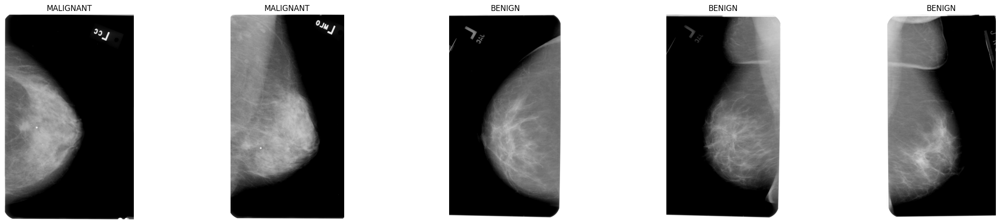

Cropped Mammograms:



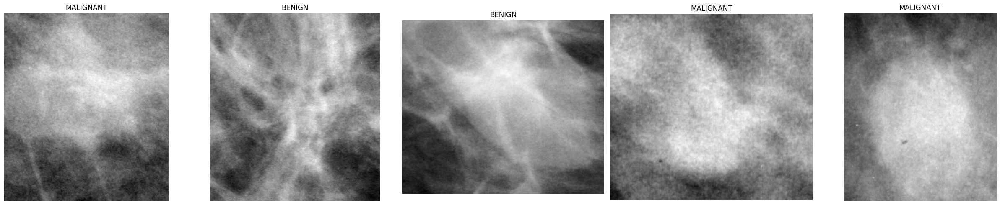

ROI Mask Mammograms:



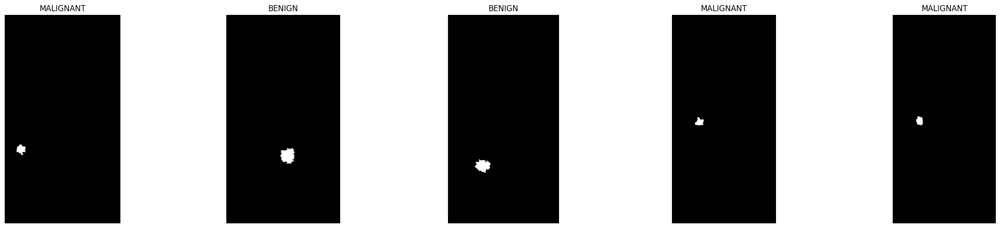

In [33]:
print('Full Mammograms:\n')
display_images('image_file_path', 5)

print('Cropped Mammograms:\n')
display_images('cropped_image_file_path', 5)

print('ROI Mask Mammograms:\n')
display_images('ROI_mask_file_path', 5)


In [58]:
from tensorflow.keras.utils import to_categorical
# Import necessary TensorFlow libraries

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

# from tensorflow.keras.applications.resnet50 import ResNet50

from tensorflow.keras.layers import GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.models import Model

from tensorflow.keras.layers import Input, Dense, Dropout
# from tensorflow.keras.applications.densenet import DenseNet169
import keras
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.utils import to_categorical

from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix
import warnings

# Suppress all warnings globally
warnings.filterwarnings("ignore")


In [80]:
#second preprocessing
def image_processor(image_path, target_size):
    """Preprocess images for CNN model"""
    absolute_image_path = os.path.abspath(image_path)
    #image = cv2.imread(absolute_image_path)
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.imread(absolute_image_path, cv2.IMREAD_GRAYSCALE)

    # Skip unreadable or empty images
    if image is None:
        print(f"Skipping unreadable image: {absolute_image_path}")
        return None
    
    # Resize image
    image = cv2.resize(image, (target_size[1], target_size[0]))
    
    # Histogram Equalization
    #image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    #l_channel, a_channel, b_channel = cv2.split(image)
    #clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    #l_channel = clahe.apply(l_channel)
    #image = cv2.merge((l_channel, a_channel, b_channel))
    #image = cv2.cvtColor(image, cv2.COLOR_LAB2RGB)
    
     #Negative transformation
    #image = 255 - image
    
     #Rescale to [0, 1]
    image = image.astype(np.float32) / 255.0
    
    return image

In [81]:
# Merge datasets
full_mass = pd.concat([mass_train_df, mass_test_df], axis=0)

In [82]:
# Define the target size
target_size = (224, 224, 3)

In [83]:
# Sample a subset of images
sample_size = 1696  # Adjust the sample size as needed
full_mass_sample = full_mass.sample(n=sample_size, random_state=42)

In [84]:
# Apply preprocessor to train data
full_mass_sample['processed_images'] = full_mass_sample['image_file_path'].apply(
    lambda x: image_processor(x, target_size)
)
full_mass_sample['mask_images'] = full_mass_sample['ROI_mask_file_path'].apply(
    lambda y: image_processor(y, target_size)
)


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.175476572912204146233170994160170991797/1-227.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.199195778912558713817031507321459770006/1-135.jpg


[ WARN:0@2567.168] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.175476572912204146233170994160170991797/1-227.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2567.333] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.199195778912558713817031507321459770006/1-135.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.336120486712406273923832111983569913869/1-113.jpg


[ WARN:0@2567.444] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.336120486712406273923832111983569913869/1-113.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.180869746613853192241744905213634425726/1-281.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.235220303613128401917357295780294851812/1-186.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.258122848711932114229110145764023097059/1-085.jpg


[ WARN:0@2567.753] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.180869746613853192241744905213634425726/1-281.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2567.869] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.235220303613128401917357295780294851812/1-186.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2567.939] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.258122848711932114229110145764023097059/1-085.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.174014585211651496903314748162396558249/1-258.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.19175306412221051336720162903880247165/1-065.jpg


[ WARN:0@2567.979] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.174014585211651496903314748162396558249/1-258.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2567.979] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.19175306412221051336720162903880247165/1-065.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.117454129112394095421646199292904617412/1-105.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.16311307713420957612660499721513179515/1-262.jpg


[ WARN:0@2568.247] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.117454129112394095421646199292904617412/1-105.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2568.408] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.16311307713420957612660499721513179515/1-262.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.128110220510263998502063254390605854196/1-054.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.417738311511512636014376396132371802556/1-038.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385542139512279828113137552801440217253/1-091.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.171166015912754582622813408142073790722/1-096.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.334704328611391643805508991083300190349/1-108.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.269090020912271881612869996851061481178/1-265.jpg


[ WARN:0@2568.786] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.128110220510263998502063254390605854196/1-054.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2568.787] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.417738311511512636014376396132371802556/1-038.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2568.912] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385542139512279828113137552801440217253/1-091.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2568.912] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.171166015912754582622813408142073790722/1-096.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2568.913] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.397197585712576980835218625502162434719/1-026.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.154058962613328519929136864181603772657/1-205.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.17179439612364242913491828612897592599/1-075.jpg


[ WARN:0@2569.241] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.397197585712576980835218625502162434719/1-026.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2569.390] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.154058962613328519929136864181603772657/1-205.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2569.423] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.17179439612364242913491828612897592599/1-075.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.403824995113685855926042098451429311853/1-259.jpg


[ WARN:0@2569.859] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.403824995113685855926042098451429311853/1-259.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.293359047911187270714650133994167840030/1-181.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.263918199211476516622099513693475115311/1-190.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.162585879813814097935228732511788537826/1-119.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.321571514713247316135159699532641256508/1-215.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.83748848211897641311753926793600384304/1-117.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.388721083313285222217770141913502774487/1-233.jpg


[ WARN:0@2570.096] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.293359047911187270714650133994167840030/1-181.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2570.096] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.263918199211476516622099513693475115311/1-190.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2570.125] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.162585879813814097935228732511788537826/1-119.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2570.125] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.321571514713247316135159699532641256508/1-215.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2570.203] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.242629471012127869529548965622673332057/1-258.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.52911228912044066036741669740519618759/1-054.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.9383151312430789908711205212663448581/1-243.jpg


[ WARN:0@2570.317] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.242629471012127869529548965622673332057/1-258.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2570.318] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.52911228912044066036741669740519618759/1-054.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2570.512] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.9383151312430789908711205212663448581/1-243.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.158760583312396940802790127503023485498/1-099.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.290229220113810647235081932003928413427/1-046.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.280437157711493692000884645494047094463/1-130.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.283896293710468565409445671813981066945/1-033.jpg


[ WARN:0@2570.689] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.158760583312396940802790127503023485498/1-099.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2570.690] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.290229220113810647235081932003928413427/1-046.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2570.691] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.280437157711493692000884645494047094463/1-130.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2570.862] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.283896293710468565409445671813981066945/1-033.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.8345832613913482803966749762437997260/1-017.jpg


[ WARN:0@2571.028] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.8345832613913482803966749762437997260/1-017.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.232043140012455442340816109393409527243/1-168.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.69102481911614345738992761764104656383/1-112.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.57356823611525636036904521060745035167/1-236.jpg


[ WARN:0@2571.661] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.232043140012455442340816109393409527243/1-168.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2571.688] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.69102481911614345738992761764104656383/1-112.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2571.787] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.57356823611525636036904521060745035167/1-236.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.270615391512904438603136029871346997827/1-180.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.304645495911706483111438481251619390979/1-117.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.162995550512107573002420048841033718661/1-115.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.70876162012018497914376684992676851191/1-181.jpg


[ WARN:0@2572.045] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.270615391512904438603136029871346997827/1-180.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2572.045] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.304645495911706483111438481251619390979/1-117.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2572.200] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.162995550512107573002420048841033718661/1-115.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2572.200] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.70876162012018497914376684992676851191/1-181.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.74118182511203115438320774433815814204/1-054.jpg


[ WARN:0@2572.256] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.74118182511203115438320774433815814204/1-054.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.149772059212195203914176201483014915047/1-158.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.234810835612633355538815031322259010855/1-061.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.188171322412490158916861741203390183722/1-215.jpg


[ WARN:0@2572.664] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.149772059212195203914176201483014915047/1-158.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2572.851] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.234810835612633355538815031322259010855/1-061.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2572.851] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.188171322412490158916861741203390183722/1-215.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.8846141612920489319812758360158257270/1-050.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.109231371313746091407897394002747255810/1-090.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.145489058813789765335170389942387615556/1-040.jpg


[ WARN:0@2572.920] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.8846141612920489319812758360158257270/1-050.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2573.003] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.109231371313746091407897394002747255810/1-090.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2573.053] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.145489058813789765335170389942387615556/1-040.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.78684859813284664039916578740172712994/1-069.jpg


[ WARN:0@2573.220] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.78684859813284664039916578740172712994/1-069.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.345140832810160378520078721331878282316/1-105.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.417608135813097018923712441772099200133/1-167.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.357895865312935232740791412752491722139/1-273.jpg


[ WARN:0@2573.430] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.345140832810160378520078721331878282316/1-105.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2573.488] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.417608135813097018923712441772099200133/1-167.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2573.524] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.357895865312935232740791412752491722139/1-273.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.69745952012889155812092274262822416242/1-097.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.303187804912710561742283155760426369730/1-239.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.245550762511135550738178630953626561752/1-283.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.113107599413757334715056198522480123157/1-223.jpg


[ WARN:0@2573.799] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.69745952012889155812092274262822416242/1-097.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2573.861] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.303187804912710561742283155760426369730/1-239.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2573.861] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.245550762511135550738178630953626561752/1-283.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2573.989] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.113107599413757334715056198522480123157/1-223.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.172386840512013560230074211023706864061/1-077.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.158164935212165043120376357330832910201/1-177.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.371739864613089761719883355291307551226/1-046.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.246326421513862106416389991742169179906/1-107.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.30946803412446097718909326270548961243/1-153.jpg


[ WARN:0@2574.138] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.172386840512013560230074211023706864061/1-077.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2574.138] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.158164935212165043120376357330832910201/1-177.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2574.228] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.371739864613089761719883355291307551226/1-046.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2574.295] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.246326421513862106416389991742169179906/1-107.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2574.295] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.67409892012207587532711656111341914913/1-113.jpg


[ WARN:0@2574.361] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.67409892012207587532711656111341914913/1-113.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.12669257310082858042663169390086466638/1-014.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.216808559312941034119240923160831351862/1-272.jpg


[ WARN:0@2574.603] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.12669257310082858042663169390086466638/1-014.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2574.687] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.216808559312941034119240923160831351862/1-272.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.201240665512195560313953074353682854284/1-122.jpg


[ WARN:0@2574.866] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.201240665512195560313953074353682854284/1-122.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419780045811507010327582708564022857860/1-299.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.288980828511203708511066530843699446563/1-225.jpg


[ WARN:0@2575.328] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419780045811507010327582708564022857860/1-299.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2575.329] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.288980828511203708511066530843699446563/1-225.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.44065475811569696824006401280610368950/1-228.jpg


[ WARN:0@2576.261] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.44065475811569696824006401280610368950/1-228.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.151746203711583824325790496232356555781/1-133.jpg


[ WARN:0@2576.496] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.151746203711583824325790496232356555781/1-133.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.325293736011893421816901315930122472763/1-183.jpg


[ WARN:0@2576.808] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.325293736011893421816901315930122472763/1-183.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.54848434312309044100463325442088001375/1-148.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.33507760912554145902744111920344485171/1-235.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.191684932212508771025952925500117559600/1-118.jpg


[ WARN:0@2577.195] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.54848434312309044100463325442088001375/1-148.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2577.237] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.33507760912554145902744111920344485171/1-235.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2577.382] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.191684932212508771025952925500117559600/1-118.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.200394253511150032912987268422492919749/1-191.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.149183380211624614428278537532778083640/1-178.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.370020768811676220424047464123530592133/1-204.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.416023076012080833905740875610727249164/1-196.jpg


[ WARN:0@2577.438] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.200394253511150032912987268422492919749/1-191.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2577.520] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.149183380211624614428278537532778083640/1-178.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2577.521] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.370020768811676220424047464123530592133/1-204.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2577.556] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.416023076012080833905740875610727249164/1-196.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.175043772610570804328930190413021504082/1-133.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.395806490413060973910077403213561423281/1-097.jpg


[ WARN:0@2577.816] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.175043772610570804328930190413021504082/1-133.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2577.989] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.395806490413060973910077403213561423281/1-097.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.95066275112816836637397827910274893726/1-298.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.208612233610863139028646317134220626037/1-021.jpg


[ WARN:0@2578.203] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.95066275112816836637397827910274893726/1-298.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2578.347] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.208612233610863139028646317134220626037/1-021.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.168142052011948789309937030612218988654/1-068.jpg


[ WARN:0@2578.427] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.168142052011948789309937030612218988654/1-068.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.125012772811929054738373917960770689523/1-273.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.141690078312425196829711709851898133059/1-195.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.311879772413692509211401737020929176955/1-177.jpg


[ WARN:0@2578.892] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.125012772811929054738373917960770689523/1-273.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2579.016] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.141690078312425196829711709851898133059/1-195.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2579.017] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.311879772413692509211401737020929176955/1-177.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.231418499611483562804956443353410908413/1-012.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.227359829311782247437660996313591134165/1-265.jpg


[ WARN:0@2579.120] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.231418499611483562804956443353410908413/1-012.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2579.157] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.227359829311782247437660996313591134165/1-265.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.241213639112627717226706279733585932152/1-003.jpg


[ WARN:0@2579.621] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.241213639112627717226706279733585932152/1-003.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.95930514311143196521379851620797527375/1-133.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.272184723711385047630954095450427972031/1-184.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.83882081811707961806397341681542038535/1-198.jpg


[ WARN:0@2579.956] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.95930514311143196521379851620797527375/1-133.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2579.956] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.272184723711385047630954095450427972031/1-184.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2580.058] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.83882081811707961806397341681542038535/1-198.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.223355501110410477409262071651794035858/1-060.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.120465669611268291509420478952677521038/1-173.jpg


[ WARN:0@2580.304] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.223355501110410477409262071651794035858/1-060.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2580.440] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.120465669611268291509420478952677521038/1-173.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.85686461910787171020983218554121150052/1-291.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.175043772610570804328930190413021504082/1-133.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.265953197912973660327069359641506533925/1-288.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.100632214012866120117337678502539182046/1-075.jpg


[ WARN:0@2580.902] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.85686461910787171020983218554121150052/1-291.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2580.902] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.175043772610570804328930190413021504082/1-133.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2581.052] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.265953197912973660327069359641506533925/1-288.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2581.054] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.100632214012866120117337678502539182046/1-075.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.95066275112816836637397827910274893726/1-298.jpg


[ WARN:0@2581.156] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.95066275112816836637397827910274893726/1-298.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.55307148413799814332579214442886195340/1-298.jpg


[ WARN:0@2581.390] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.55307148413799814332579214442886195340/1-298.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.219607249012903142628057639991148226306/1-072.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.36825032713107530300938213160028717974/1-270.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419410657312812960613390693250292392446/1-037.jpg


[ WARN:0@2581.636] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.219607249012903142628057639991148226306/1-072.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2581.637] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.36825032713107530300938213160028717974/1-270.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2581.753] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419410657312812960613390693250292392446/1-037.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.138854373111438727811729486684128233341/1-172.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.1147559510416701110684356293737205301/1-079.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.59887648512379053809277845872128232362/1-106.jpg


[ WARN:0@2581.986] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.138854373111438727811729486684128233341/1-172.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2581.986] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.1147559510416701110684356293737205301/1-079.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2582.087] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.59887648512379053809277845872128232362/1-106.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.328977677511962475112321192060403830590/1-242.jpg


[ WARN:0@2582.293] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.328977677511962475112321192060403830590/1-242.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.194084118912652164632677195583265936023/1-190.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.176964796612485740037787572680731561117/1-077.jpg


[ WARN:0@2582.501] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.194084118912652164632677195583265936023/1-190.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2582.567] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.176964796612485740037787572680731561117/1-077.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.349504173712862535704286567751526799904/1-020.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.100522676511025180541602449080267145647/1-111.jpg


[ WARN:0@2582.703] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.349504173712862535704286567751526799904/1-020.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2582.731] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.100522676511025180541602449080267145647/1-111.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.172787227312499793236059621232382095130/1-267.jpg


[ WARN:0@2583.289] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.172787227312499793236059621232382095130/1-267.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.313320260312335825215652094932408846389/1-089.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.122014842013197980401803659680241641105/1-058.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.62593965512657640623373713153873390284/1-129.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.28994390011193705314585586210966915731/1-163.jpg


[ WARN:0@2583.660] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.313320260312335825215652094932408846389/1-089.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2583.683] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.122014842013197980401803659680241641105/1-058.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2583.828] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.62593965512657640623373713153873390284/1-129.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2583.857] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.28994390011193705314585586210966915731/1-163.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.317213562911173877740615561593769151663/1-037.jpg


[ WARN:0@2584.053] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.317213562911173877740615561593769151663/1-037.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.361510015512526913136413449054168104152/1-230.jpg


[ WARN:0@2584.334] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.361510015512526913136413449054168104152/1-230.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.56526196612878022942647118353975254976/1-017.jpg


[ WARN:0@2584.617] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.56526196612878022942647118353975254976/1-017.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.382912580213452264934816946051837938528/1-036.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.46228080811339703822182406561482041808/1-085.jpg


[ WARN:0@2584.827] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.382912580213452264934816946051837938528/1-036.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2584.899] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.46228080811339703822182406561482041808/1-085.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.27953444711693870518443009471767038842/1-179.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.364070243511921550101340386794199125508/1-107.jpg


[ WARN:0@2585.308] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.27953444711693870518443009471767038842/1-179.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2585.469] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.364070243511921550101340386794199125508/1-107.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.220564602411627135838034738500414889195/1-044.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.273104176312975794115853377520445198068/1-149.jpg


[ WARN:0@2585.898] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.220564602411627135838034738500414889195/1-044.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2585.898] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.273104176312975794115853377520445198068/1-149.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.403835121912715843000196868400248684588/1-104.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419410657312812960613390693250292392446/1-037.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.95930514311143196521379851620797527375/1-133.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.139051271411881139019982240242711370769/1-061.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.4258120910410897428422437754132883711/1-109.jpg


[ WARN:0@2586.131] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.403835121912715843000196868400248684588/1-104.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2586.131] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419410657312812960613390693250292392446/1-037.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2586.244] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.95930514311143196521379851620797527375/1-133.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2586.289] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.139051271411881139019982240242711370769/1-061.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2586.317] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.281986553811315949820316643132362105669/1-198.jpg


[ WARN:0@2586.375] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.281986553811315949820316643132362105669/1-198.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385754322612458255422314848630057330699/1-274.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.374524690313732405614119264610057663073/1-035.jpg


[ WARN:0@2586.821] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385754322612458255422314848630057330699/1-274.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2586.821] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.374524690313732405614119264610057663073/1-035.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.412557731711484790541710247932923951861/1-187.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.282187186212471477920122594912799518222/1-128.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.231418499611483562804956443353410908413/1-012.jpg


[ WARN:0@2587.226] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.412557731711484790541710247932923951861/1-187.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2587.261] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.282187186212471477920122594912799518222/1-128.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2587.284] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.231418499611483562804956443353410908413/1-012.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.241488192410870375308842249503092939065/1-191.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.354974451012606666730836312563315842748/1-072.jpg


[ WARN:0@2587.463] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.241488192410870375308842249503092939065/1-191.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2587.553] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.354974451012606666730836312563315842748/1-072.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.119329332411807101909567041850958066649/1-242.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.280715336413264839123954197972783877415/1-209.jpg


[ WARN:0@2587.761] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.119329332411807101909567041850958066649/1-242.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2587.761] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.280715336413264839123954197972783877415/1-209.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.351386294512687684821629395204182081789/1-138.jpg


[ WARN:0@2588.257] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.351386294512687684821629395204182081789/1-138.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.424375028213529712235170387420953707530/1-257.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.351095773812262405525829356842200610924/1-251.jpg


[ WARN:0@2588.532] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.424375028213529712235170387420953707530/1-257.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2588.721] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.351095773812262405525829356842200610924/1-251.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.10317846812362504718225532432231442871/1-233.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.92873692112697289717564934862862198857/1-279.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.328977677511962475112321192060403830590/1-242.jpg


[ WARN:0@2589.243] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.10317846812362504718225532432231442871/1-233.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2589.298] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.92873692112697289717564934862862198857/1-279.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2589.353] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.328977677511962475112321192060403830590/1-242.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.69688454812257584638918432052709217066/1-003.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.17873451612287715806233693563532897726/1-111.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.88567571811865245834350703782525414557/1-188.jpg


[ WARN:0@2589.473] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.69688454812257584638918432052709217066/1-003.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2589.473] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.17873451612287715806233693563532897726/1-111.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2589.580] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.88567571811865245834350703782525414557/1-188.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2589.743] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.136087942912627055207233775400589898698/1-106.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2589.914] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.136087942912627055207233775400589898698/1-106.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.212873695611515204908544382810356004572/1-077.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.26328160312807915105944979513644204307/1-042.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.413759996612745390518110068652608488468/1-258.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.46561815111905129726185322260150997233/1-070.jpg


[ WARN:0@2590.047] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.26328160312807915105944979513644204307/1-042.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2590.089] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.413759996612745390518110068652608488468/1-258.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2590.123] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.46561815111905129726185322260150997233/1-070.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.298507260212876852534436916713961683073/1-072.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.33525463311604309520509720512605682139/1-244.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.90049668411003307234280101243836805116/1-156.jpg


[ WARN:0@2590.479] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.298507260212876852534436916713961683073/1-072.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2590.543] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.33525463311604309520509720512605682139/1-244.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2590.543] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.90049668411003307234280101243836805116/1-156.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.181882185012532469840938456443196306608/1-100.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.122014842013197980401803659680241641105/1-058.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.18321540012684193708096260002352282494/1-112.jpg


[ WARN:0@2590.769] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.181882185012532469840938456443196306608/1-100.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2590.834] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.122014842013197980401803659680241641105/1-058.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2590.964] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.18321540012684193708096260002352282494/1-112.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.399831242111800621220027542190666363688/1-046.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.225312674712404832441253979110135741852/1-200.jpg


[ WARN:0@2591.031] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.399831242111800621220027542190666363688/1-046.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2591.137] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.225312674712404832441253979110135741852/1-200.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.283057547411492757733739237421644364669/1-262.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.129176419311733274935464126784195349376/1-029.jpg


[ WARN:0@2591.268] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.283057547411492757733739237421644364669/1-262.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2591.365] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.129176419311733274935464126784195349376/1-029.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.52961829611670829303289191680479351305/1-245.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.261521794613721978940690958173191292096/1-290.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.51941006212124694604546402963586764653/1-012.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.144135582511225260304642832923710501704/1-125.jpg


[ WARN:0@2591.608] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.52961829611670829303289191680479351305/1-245.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2591.632] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.261521794613721978940690958173191292096/1-290.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2591.632] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.51941006212124694604546402963586764653/1-012.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2591.711] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.144135582511225260304642832923710501704/1-125.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.211640311212194984322998849642182089069/1-112.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.88886372611812195428352690450990697351/1-008.jpg


[ WARN:0@2591.830] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.211640311212194984322998849642182089069/1-112.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2591.984] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.88886372611812195428352690450990697351/1-008.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.361011800613187938628920052961866947309/1-242.jpg


[ WARN:0@2592.110] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.361011800613187938628920052961866947309/1-242.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.368677889211938858542071548600720272101/1-296.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.366557165612782681202292343440774546974/1-225.jpg


[ WARN:0@2592.922] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.368677889211938858542071548600720272101/1-296.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2593.077] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.366557165612782681202292343440774546974/1-225.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.277904999011825388509729900852338577655/1-135.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.47853905212613770720342330132409520084/1-111.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.160090908610489507721266482061808282031/1-138.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.57854390411125252714525874340062956276/1-102.jpg


[ WARN:0@2593.167] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.277904999011825388509729900852338577655/1-135.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2593.196] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.47853905212613770720342330132409520084/1-111.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2593.288] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.160090908610489507721266482061808282031/1-138.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2593.332] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.57854390411125252714525874340062956276/1-102.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.44354553611120086116092433180902992105/1-142.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.258560655311028193625111499672480670508/1-006.jpg


[ WARN:0@2594.140] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.44354553611120086116092433180902992105/1-142.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2594.235] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.258560655311028193625111499672480670508/1-006.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.19233593713150936611511674154223618351/1-027.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.317216124410630220004117216344047489299/1-182.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.135126056112780974433437774491962300014/1-037.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.425182509912779827704955040293854758529/1-022.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.404577305912728645825627508702429716956/1-194.jpg


[ WARN:0@2594.586] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.19233593713150936611511674154223618351/1-027.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2594.667] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.317216124410630220004117216344047489299/1-182.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2594.667] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.135126056112780974433437774491962300014/1-037.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2594.708] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.425182509912779827704955040293854758529/1-022.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2594.708] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.226496395312887740508078232422990396199/1-009.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.317382923213614689928747109691347347957/1-199.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.136495231711077347326245851332072991979/1-142.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.200948278212842430531410154721256979027/1-169.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.423418338111627617941958352860375625032/1-093.jpg


[ WARN:0@2595.139] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.226496395312887740508078232422990396199/1-009.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2595.140] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.317382923213614689928747109691347347957/1-199.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2595.140] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.136495231711077347326245851332072991979/1-142.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2595.140] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.200948278212842430531410154721256979027/1-169.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2595.224] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.220564602411627135838034738500414889195/1-044.jpg


[ WARN:0@2595.446] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.220564602411627135838034738500414889195/1-044.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.94855395812079770126816595643794643222/1-041.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.238090837412902571926841401701921392882/1-247.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.144954714312199212434707587871456397264/1-127.jpg


[ WARN:0@2595.649] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.94855395812079770126816595643794643222/1-041.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2595.681] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.238090837412902571926841401701921392882/1-247.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2595.739] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.144954714312199212434707587871456397264/1-127.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.124069151812440873834583830380563934034/1-123.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.260358200912160591136730728193628472216/1-238.jpg


[ WARN:0@2595.884] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.124069151812440873834583830380563934034/1-123.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2595.978] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.260358200912160591136730728193628472216/1-238.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.19265558812219808138485666643988286593/1-238.jpg


[ WARN:0@2596.108] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.19265558812219808138485666643988286593/1-238.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.74088365112551230507136001593462769806/1-147.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.46282940310410044707024149930022040952/1-142.jpg


[ WARN:0@2596.344] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.74088365112551230507136001593462769806/1-147.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2596.494] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.46282940310410044707024149930022040952/1-142.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.403249842912482807608031953090899102748/1-081.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.194014761511237421025886729180261985635/1-290.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.65397885011427959107666095712572175020/1-297.jpg


[ WARN:0@2596.577] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.403249842912482807608031953090899102748/1-081.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2596.577] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.194014761511237421025886729180261985635/1-290.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2596.623] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.65397885011427959107666095712572175020/1-297.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.268167584712827481520301103922935194568/1-155.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.304847144212231865016298922630149685326/1-078.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.295394441612082321922200964343746626621/1-002.jpg


[ WARN:0@2596.832] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.268167584712827481520301103922935194568/1-155.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2596.832] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.304847144212231865016298922630149685326/1-078.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2596.882] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.295394441612082321922200964343746626621/1-002.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.27655563411193153813026594573787372096/1-062.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.42743836211077677906084043904182953420/1-276.jpg


[ WARN:0@2597.034] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.27655563411193153813026594573787372096/1-062.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2597.229] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.42743836211077677906084043904182953420/1-276.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.228112769110310508212894048352876218391/1-288.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.299665718312676631426589111303357883600/1-037.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.25032151411293752139034702442380199664/1-202.jpg


[ WARN:0@2597.284] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.228112769110310508212894048352876218391/1-288.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2597.318] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.299665718312676631426589111303357883600/1-037.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2597.447] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.25032151411293752139034702442380199664/1-202.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.265454151711796157924978185193155462733/1-241.jpg


[ WARN:0@2597.491] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.265454151711796157924978185193155462733/1-241.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.50489409611504312524210891883569393093/1-129.jpg


[ WARN:0@2597.724] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.50489409611504312524210891883569393093/1-129.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.256330807412877366440153727190246662818/1-055.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.392008643813084177039922070163021225657/1-079.jpg


[ WARN:0@2598.209] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.256330807412877366440153727190246662818/1-055.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2598.377] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.392008643813084177039922070163021225657/1-079.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.398065969612214189500602623110797804795/1-154.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.148157969912384261328015497391094806291/1-083.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.152233603112126251623360168063905498710/1-282.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.362096355311749880109413095802268936069/1-263.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.247139233113856247217565715372804656493/1-231.jpg


[ WARN:0@2598.462] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.398065969612214189500602623110797804795/1-154.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2598.462] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.148157969912384261328015497391094806291/1-083.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2598.463] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.152233603112126251623360168063905498710/1-282.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2598.491] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.362096355311749880109413095802268936069/1-263.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2598.651] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.27980645513718577626150235351487309400/1-147.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.359948563313211921203994090300862857070/1-196.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.308645904112578662514088364913247733416/1-152.jpg


[ WARN:0@2598.703] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.27980645513718577626150235351487309400/1-147.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2598.748] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.359948563313211921203994090300862857070/1-196.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2598.894] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.308645904112578662514088364913247733416/1-152.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.151178406511629586605682927950166107710/1-203.jpg


[ WARN:0@2599.334] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.151178406511629586605682927950166107710/1-203.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.149608967312503353909450618211677669934/1-256.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.76958903112621704936459227274115747517/1-117.jpg


[ WARN:0@2599.758] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.149608967312503353909450618211677669934/1-256.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2599.865] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.76958903112621704936459227274115747517/1-117.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.65603312513435703008593993544017526418/1-228.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.116404757511169555513192121640222765024/1-084.jpg


[ WARN:0@2600.115] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.65603312513435703008593993544017526418/1-228.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2600.311] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.116404757511169555513192121640222765024/1-084.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.189618700912186602728870178774202689346/1-025.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.168142052011948789309937030612218988654/1-068.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.262900378610637773719221008832166959346/1-120.jpg


[ WARN:0@2600.346] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.189618700912186602728870178774202689346/1-025.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2600.346] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.168142052011948789309937030612218988654/1-068.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2600.412] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.262900378610637773719221008832166959346/1-120.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.104175843212955332137248400671186776872/1-262.jpg


[ WARN:0@2600.822] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.104175843212955332137248400671186776872/1-262.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.345891015013816713918233478951770382675/1-140.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.260826680211463150629506377090181207701/1-120.jpg


[ WARN:0@2601.172] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.345891015013816713918233478951770382675/1-140.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2601.278] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.260826680211463150629506377090181207701/1-120.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.421506712613822555700638363361805204735/1-039.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.91499954013996703516414818583573199018/1-264.jpg


[ WARN:0@2601.493] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.421506712613822555700638363361805204735/1-039.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2601.494] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.91499954013996703516414818583573199018/1-264.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.27686561811725760701013428913326410240/1-147.jpg


[ WARN:0@2601.979] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.27686561811725760701013428913326410240/1-147.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.413066189111289743521076284514105478750/1-197.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.147836511311460633701654478620200219052/1-057.jpg


[ WARN:0@2602.289] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.413066189111289743521076284514105478750/1-197.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2602.329] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.147836511311460633701654478620200219052/1-057.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.284762492511939117113096431964067150055/1-217.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.63200910512557522821086711330263634348/1-016.jpg


[ WARN:0@2602.704] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.284762492511939117113096431964067150055/1-217.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2602.791] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.63200910512557522821086711330263634348/1-016.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.408841612911259188639006846810670253077/1-274.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.255728555213663489012061953844243079023/1-107.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.47970571410947468918537931823160772974/1-245.jpg


[ WARN:0@2602.962] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.408841612911259188639006846810670253077/1-274.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2602.962] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.255728555213663489012061953844243079023/1-107.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2603.070] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.47970571410947468918537931823160772974/1-245.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.20451842012947487407679988681863733854/1-234.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.227873690711676823827576319042588800296/1-210.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.54057852711245745614684087582249091583/1-113.jpg


[ WARN:0@2603.194] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.20451842012947487407679988681863733854/1-234.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2603.194] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.227873690711676823827576319042588800296/1-210.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2603.250] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.54057852711245745614684087582249091583/1-113.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.55778548111209969424695307662410813691/1-016.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.159917220213401433113606588331484616686/1-154.jpg


[ WARN:0@2603.397] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.55778548111209969424695307662410813691/1-016.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2603.504] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.159917220213401433113606588331484616686/1-154.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.318799084911119262430780458250312419361/1-104.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.52106446513173201929277628250108419748/1-086.jpg


[ WARN:0@2603.710] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.318799084911119262430780458250312419361/1-104.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2603.865] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.52106446513173201929277628250108419748/1-086.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.148897897112363547336820799050685302111/1-153.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.401023586412655416321348819711950708264/1-068.jpg


[ WARN:0@2604.109] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.148897897112363547336820799050685302111/1-153.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2604.158] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.401023586412655416321348819711950708264/1-068.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.194693289311221141704233109863353072257/1-194.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.168142052011948789309937030612218988654/1-068.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.179458899812520629223660238622755428813/1-163.jpg


[ WARN:0@2604.397] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.194693289311221141704233109863353072257/1-194.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2604.397] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.168142052011948789309937030612218988654/1-068.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2604.461] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.179458899812520629223660238622755428813/1-163.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.85914409911351710839139096720265170726/1-121.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.405770000712613552327460084591951406869/1-255.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.108774078613788646228188307731057957441/1-204.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.229153389010770069434497957601415230725/1-099.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.194578416513260370005941884310932343300/1-267.jpg


[ WARN:0@2604.734] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.85914409911351710839139096720265170726/1-121.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2604.774] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.405770000712613552327460084591951406869/1-255.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2604.813] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.108774078613788646228188307731057957441/1-204.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2604.831] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.229153389010770069434497957601415230725/1-099.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2604.847] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.174306451512326600232528311571344224372/1-057.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.328888964910420470437557917552593278246/1-172.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.251872183712067758830824012051583087146/1-164.jpg


[ WARN:0@2605.201] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.174306451512326600232528311571344224372/1-057.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2605.272] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.328888964910420470437557917552593278246/1-172.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2605.364] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.251872183712067758830824012051583087146/1-164.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.107751848713697696607707227450395136936/1-051.jpg


[ WARN:0@2605.444] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.107751848713697696607707227450395136936/1-051.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.99652509111900105331025325421855924911/1-156.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.359653834712357915523724051462222236076/1-181.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.122014842013197980401803659680241641105/1-058.jpg


[ WARN:0@2606.116] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.99652509111900105331025325421855924911/1-156.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2606.117] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.359653834712357915523724051462222236076/1-181.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2606.268] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.122014842013197980401803659680241641105/1-058.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.284507638613416758207872997261004998521/1-026.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.82469470811582019730628947720344371460/1-286.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.326151466811725669429426336100792405365/1-014.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.199040568111077523402855758172229500384/1-000.jpg


[ WARN:0@2606.411] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.284507638613416758207872997261004998521/1-026.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2606.496] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.82469470811582019730628947720344371460/1-286.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2606.564] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.326151466811725669429426336100792405365/1-014.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2606.597] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.199040568111077523402855758172229500384/1-000.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.70012532911736490135306300510795887564/1-204.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.373282707011960449216083283203138529156/1-123.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.57409664311439109642852588912629488901/1-144.jpg


[ WARN:0@2606.782] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.70012532911736490135306300510795887564/1-204.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2606.842] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.373282707011960449216083283203138529156/1-123.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2606.893] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.57409664311439109642852588912629488901/1-144.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.353764633213863442442494539840710764601/1-092.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385542139512279828113137552801440217253/1-091.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.403050124711420404835698594840910402827/1-254.jpg


[ WARN:0@2607.115] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.353764633213863442442494539840710764601/1-092.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2607.302] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385542139512279828113137552801440217253/1-091.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2607.303] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.403050124711420404835698594840910402827/1-254.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385132842112234370219192252632712589242/1-172.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.166340572313787163317606045813812419177/1-075.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385006824412335838937657967684130607502/1-139.jpg


[ WARN:0@2607.822] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385132842112234370219192252632712589242/1-172.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2607.915] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.166340572313787163317606045813812419177/1-075.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2607.915] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385006824412335838937657967684130607502/1-139.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.53164963713539945704420389270899642316/1-128.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.220564602411627135838034738500414889195/1-044.jpg


[ WARN:0@2608.138] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.53164963713539945704420389270899642316/1-128.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2608.297] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.220564602411627135838034738500414889195/1-044.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.6277281410639072436330631001055971673/1-191.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.218620318613956716810749252141856797976/1-299.jpg


[ WARN:0@2608.389] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.6277281410639072436330631001055971673/1-191.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2608.584] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.218620318613956716810749252141856797976/1-299.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.91058729212200153403438754930629868603/1-273.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.425698079412077502741643782591283336956/1-267.jpg


[ WARN:0@2608.875] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.91058729212200153403438754930629868603/1-273.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2608.875] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.425698079412077502741643782591283336956/1-267.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.113520701010845494417306400603477997325/1-227.jpg


[ WARN:0@2609.285] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.113520701010845494417306400603477997325/1-227.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.223200299211434089119224646431205382397/1-219.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.269371263412811256614469730851947013418/1-296.jpg


[ WARN:0@2609.507] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.223200299211434089119224646431205382397/1-219.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2609.635] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.269371263412811256614469730851947013418/1-296.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.394792236611156603001230316853617554862/1-115.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.306024108010728918506901922744233626490/1-188.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.362620324812321450233913983280182210137/1-281.jpg


[ WARN:0@2609.732] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.394792236611156603001230316853617554862/1-115.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2609.823] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.306024108010728918506901922744233626490/1-188.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2609.929] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.362620324812321450233913983280182210137/1-281.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.392766189012464402104913399043411120417/1-251.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.113442706011768824426077733690823693046/1-269.jpg


[ WARN:0@2610.243] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.392766189012464402104913399043411120417/1-251.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2610.295] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.113442706011768824426077733690823693046/1-269.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.12070919312880382900449340673073871236/1-210.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.343599979312034701930436051711071015260/1-077.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.362374565310914921540682385160998166344/1-112.jpg


[ WARN:0@2610.540] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.12070919312880382900449340673073871236/1-210.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2610.619] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.343599979312034701930436051711071015260/1-077.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2610.620] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.362374565310914921540682385160998166344/1-112.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.113794857611310734222099938972653890313/1-230.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.292360889211001391813520710751199015294/1-051.jpg


[ WARN:0@2610.874] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.113794857611310734222099938972653890313/1-230.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2610.903] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.292360889211001391813520710751199015294/1-051.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.251130205811673047141172596702804417464/1-094.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.266133570313100849523783768411170795888/1-228.jpg


[ WARN:0@2611.125] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.251130205811673047141172596702804417464/1-094.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2611.235] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.266133570313100849523783768411170795888/1-228.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.336294562711133796734275132653265929945/1-052.jpg


[ WARN:0@2611.400] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.336294562711133796734275132653265929945/1-052.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.189675058012591271842516184791920684602/1-051.jpg


[ WARN:0@2611.649] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.189675058012591271842516184791920684602/1-051.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.323873351911762283127423474124042969679/1-252.jpg


[ WARN:0@2611.862] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.323873351911762283127423474124042969679/1-252.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.123968816011512951434814084172747879091/1-289.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.166407449713489341006907780000949344586/1-164.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.6326146212137720929099055383856573953/1-154.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.104119411412935707132033373840932496396/1-121.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.255781430912151131328345834864129594300/1-067.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.155550497511364708026317123900311555763/1-122.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.146297207812381871014727591804106869851/1-137.jpg


[ WARN:0@2612.104] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.123968816011512951434814084172747879091/1-289.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2612.150] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.166407449713489341006907780000949344586/1-164.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2612.174] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.6326146212137720929099055383856573953/1-154.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2612.254] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.104119411412935707132033373840932496396/1-121.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2612.254] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.355464339112205472025411629030840677852/1-195.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.19398374813678635437774124921258413367/1-081.jpg


[ WARN:0@2612.515] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.355464339112205472025411629030840677852/1-195.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2612.516] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.19398374813678635437774124921258413367/1-081.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.322667976213415973414521161391249353390/1-155.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.134769761712283351009294739412953750298/1-193.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.394636780211288993834413664462575701980/1-080.jpg


[ WARN:0@2612.738] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.322667976213415973414521161391249353390/1-155.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2612.835] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.134769761712283351009294739412953750298/1-193.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2612.935] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.394636780211288993834413664462575701980/1-080.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.182021535212924472406957876541192691518/1-173.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.264906955811106358522569461023509978726/1-232.jpg


[ WARN:0@2613.052] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.182021535212924472406957876541192691518/1-173.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2613.053] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.264906955811106358522569461023509978726/1-232.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385542139512279828113137552801440217253/1-091.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.170988990012713841817997341910281230031/1-186.jpg


[ WARN:0@2613.261] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.385542139512279828113137552801440217253/1-091.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2613.351] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.170988990012713841817997341910281230031/1-186.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419552524112122749501984836111617727698/1-294.jpg


[ WARN:0@2613.726] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419552524112122749501984836111617727698/1-294.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.100682860911308271813943300011840547108/1-198.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.54589971912845806600662511713175024068/1-191.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.398258976712483192035853720641860573126/1-154.jpg


[ WARN:0@2614.067] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.100682860911308271813943300011840547108/1-198.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2614.201] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.54589971912845806600662511713175024068/1-191.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2614.201] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.398258976712483192035853720641860573126/1-154.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.12869627612231993827821925170759563675/1-196.jpg


[ WARN:0@2614.447] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.12869627612231993827821925170759563675/1-196.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.18321540012684193708096260002352282494/1-112.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.16010789511745132713883529233369038329/1-112.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419410657312812960613390693250292392446/1-037.jpg


[ WARN:0@2614.801] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.18321540012684193708096260002352282494/1-112.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2614.826] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.16010789511745132713883529233369038329/1-112.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2614.898] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419410657312812960613390693250292392446/1-037.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.110502161611149520011463704441518604678/1-058.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.35590170712015951402001860292316082102/1-256.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.325678795912867694418543446014194692233/1-128.jpg


[ WARN:0@2615.070] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.110502161611149520011463704441518604678/1-058.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2615.216] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.35590170712015951402001860292316082102/1-256.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2615.228] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.325678795912867694418543446014194692233/1-128.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.28518803912310395837837364480987494239/1-000.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.82483264013703353211043055802582138051/1-180.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.29318932712695951431444118093650037083/2-032.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.336071559511064328718791448490558949969/2-041.jpg


[ WARN:0@2615.546] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.28518803912310395837837364480987494239/1-000.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2615.547] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.82483264013703353211043055802582138051/1-180.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2615.547] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.29318932712695951431444118093650037083/2-032.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2615.596] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.336071559511064328718791448490558949969/2-041.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.312683164812188449337131936611168112246/1-108.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.190371998012909216226366286144226107826/2-165.jpg


[ WARN:0@2615.794] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.312683164812188449337131936611168112246/1-108.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2615.950] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.190371998012909216226366286144226107826/2-165.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.18695903710455254723742342582229221687/1-187.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.109452252012424458222829590173400022787/2-081.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.56409915911497420438183697022964604975/1-250.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.237226740511457824723686921453765620907/1-253.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.243787511811578838018442497410147237753/2-040.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.187667275212026947717046191624230680968/1-270.jpg


[ WARN:0@2616.046] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.18695903710455254723742342582229221687/1-187.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2616.046] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.109452252012424458222829590173400022787/2-081.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2616.176] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.56409915911497420438183697022964604975/1-250.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2616.204] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.237226740511457824723686921453765620907/1-253.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2616.206] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.371813759313271994601228594001917046161/1-065.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.389273289611161275802317999421109002390/2-132.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.214710479912729172342312170422785489241/2-078.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.255470422012641957411262465611415885514/1-076.jpg


[ WARN:0@2616.251] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.371813759313271994601228594001917046161/1-065.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2616.354] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.389273289611161275802317999421109002390/2-132.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2616.442] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.214710479912729172342312170422785489241/2-078.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2616.442] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.255470422012641957411262465611415885514/1-076.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.275099505413660906340937714374028999095/2-113.jpg


[ WARN:0@2616.538] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.275099505413660906340937714374028999095/2-113.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.160240600513539121821203198981527996806/2-290.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.239086271612143569436272249690880577883/1-161.jpg


[ WARN:0@2616.762] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.160240600513539121821203198981527996806/2-290.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2616.889] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.239086271612143569436272249690880577883/1-161.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.202283445911304389526306403130030487752/2-187.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.324309622011475628318154737932701357211/1-159.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.258350419612577688509150109583506305771/2-123.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.247934203213872381418141618123923023703/2-153.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.260137771311627538138583279643323289485/2-004.jpg


[ WARN:0@2617.064] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.202283445911304389526306403130030487752/2-187.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.214] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.324309622011475628318154737932701357211/1-159.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.235] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.258350419612577688509150109583506305771/2-123.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.235] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.247934203213872381418141618123923023703/2-153.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.264] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.245093344812536344341063041422079983468/2-157.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.281340146110857934414592536624150012224/2-056.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.426774094013742053816957912770661857707/1-214.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.294502521311914830642172663623958151512/2-111.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.42400754213228696808259017561818845713/1-254.jpg


[ WARN:0@2617.278] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.245093344812536344341063041422079983468/2-157.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.322] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.281340146110857934414592536624150012224/2-056.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.322] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.426774094013742053816957912770661857707/1-214.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.409] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.294502521311914830642172663623958151512/2-111.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.457] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.141587019911453128902709907821893946336/2-121.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.291570481913498840921190273752745496022/1-083.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.252002833411214662214987930900134701246/2-110.jpg


[ WARN:0@2617.535] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.141587019911453128902709907821893946336/2-121.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.547] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.291570481913498840921190273752745496022/1-083.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.655] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.252002833411214662214987930900134701246/2-110.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.195128105212967051304365067870504250028/2-175.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.121844987912199968113589579754023493214/1-020.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.280587160611933401703009084553597862056/2-274.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.383228819411157218228373387692252277708/1-038.jpg


[ WARN:0@2617.778] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.195128105212967051304365067870504250028/2-175.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.899] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.121844987912199968113589579754023493214/1-020.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.900] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.280587160611933401703009084553597862056/2-274.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2617.948] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.383228819411157218228373387692252277708/1-038.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419101916011003267204546254263412360938/2-003.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.337889068912217823622466563932018789324/1-298.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.260459930212973473121544705422367625902/2-255.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.343083435212496268517777179012002399753/1-145.jpg


[ WARN:0@2618.142] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.419101916011003267204546254263412360938/2-003.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.142] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.337889068912217823622466563932018789324/1-298.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.163] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.260459930212973473121544705422367625902/2-255.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.276] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.343083435212496268517777179012002399753/1-145.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.331537760513637157804168239871022697740/2-026.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.174146773011133252601051421943393040183/2-105.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.299416691811132387805047574290099100208/2-070.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.293544472312044196938017678411207859515/2-006.jpg


[ WARN:0@2618.390] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.331537760513637157804168239871022697740/2-026.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.444] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.174146773011133252601051421943393040183/2-105.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.444] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.299416691811132387805047574290099100208/2-070.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.512] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.293544472312044196938017678411207859515/2-006.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.108511516613015548417445804904165634208/1-278.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.22011950713133475930291969510689163306/2-026.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.199482819411130337534304815492391029165/1-288.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.368399442311638014605380471312770309960/2-086.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.304402775711897537235123344790702793618/2-168.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.308306388611801688834091539392375023174/1-149.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.314636098012486843933844430364271144365/1-142.jpg
Skipping unreadable image: /scratch/xxsi32

[ WARN:0@2618.608] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.108511516613015548417445804904165634208/1-278.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.608] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.22011950713133475930291969510689163306/2-026.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.609] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.199482819411130337534304815492391029165/1-288.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.690] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.368399442311638014605380471312770309960/2-086.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.714] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.90509059711545836109239433043334788481/1-126.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.356736051912504701111877477291844813740/2-183.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.82600937212058721501125633822189963843/1-013.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.354393322011557367835928690122016618367/1-060.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.184670114611965959303686276434269828677/2-181.jpg


[ WARN:0@2618.873] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.90509059711545836109239433043334788481/1-126.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.942] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.356736051912504701111877477291844813740/2-183.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.942] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.82600937212058721501125633822189963843/1-013.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2618.954] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.354393322011557367835928690122016618367/1-060.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.000] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.252709765911313151607841657963087943771/1-027.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.309298420011968951324703077181333700449/1-004.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.407994987213146477526717676850464563074/2-090.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.39194036011823625811572909260453372676/2-221.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.61134486413720104741240478022432089415/2-296.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.77795177210720655324735986231176035759/1-174.jpg


[ WARN:0@2619.202] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.252709765911313151607841657963087943771/1-027.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.226] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.309298420011968951324703077181333700449/1-004.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.261] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.407994987213146477526717676850464563074/2-090.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.273] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.39194036011823625811572909260453372676/2-221.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.309] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.39603669310727873713809627273528862680/1-283.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.370173314213157931430623420622392863680/1-105.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.402667733712709070330721404262541986194/1-284.jpg


[ WARN:0@2619.438] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.39603669310727873713809627273528862680/1-283.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.489] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.370173314213157931430623420622392863680/1-105.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.634] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.402667733712709070330721404262541986194/1-284.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.98869608012141056833257796120597025392/2-090.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.422957282012810013841418684460061208674/2-130.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.73659499810499553515093536053563289213/2-147.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.299479312912648479419761596652152845359/2-203.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.126693328711730132832126278452304581219/2-162.jpg


[ WARN:0@2619.722] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.98869608012141056833257796120597025392/2-090.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.852] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.422957282012810013841418684460061208674/2-130.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.853] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.73659499810499553515093536053563289213/2-147.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.883] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.299479312912648479419761596652152845359/2-203.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2619.911] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.318639281112853501739829339283535805827/1-157.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.138993602812076439220217343090472523549/2-020.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.360644371912187673603409637413721677692/1-105.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.232381660012554908337053795134147800079/1-147.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.421605805411613478235673271291349704748/2-211.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.217294520813663622129173556871595465656/2-232.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.167727012713850085819108783401526167252/2-274.jpg


[ WARN:0@2619.989] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.318639281112853501739829339283535805827/1-157.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.050] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.138993602812076439220217343090472523549/2-020.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.078] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.360644371912187673603409637413721677692/1-105.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.104] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.232381660012554908337053795134147800079/1-147.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.120] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.341068420311671969622955514164074452133/1-130.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.382161872912744789714360820701966974210/1-151.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.278120339712544174710677784370473996861/2-001.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.248913725011912288240186162162638948281/2-222.jpg


[ WARN:0@2620.248] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.341068420311671969622955514164074452133/1-130.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.299] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.382161872912744789714360820701966974210/1-151.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.393] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.278120339712544174710677784370473996861/2-001.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.410] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.248913725011912288240186162162638948281/2-222.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.242096569811858384728613382742918690380/2-124.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.181257396413855177417874886622490293451/1-223.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.22326887011227963702159533191468776297/2-082.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.119573462812971630637496495420314883475/1-068.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.310417008311970894938815230770265106023/1-271.jpg


[ WARN:0@2620.461] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.242096569811858384728613382742918690380/2-124.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.482] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.181257396413855177417874886622490293451/1-223.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.483] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.22326887011227963702159533191468776297/2-082.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.524] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.119573462812971630637496495420314883475/1-068.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.598] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.126781186913766854307439581580291836768/2-141.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.370932447012682741839171063160938015619/2-116.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.53542233411818606701776508291995689378/2-239.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.93494546611194317304163767440525328501/1-003.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.398519079512363168827806972161822892706/1-289.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.129594164412130614306422222392803220137/1-271.jpg


[ WARN:0@2620.698] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.126781186913766854307439581580291836768/2-141.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.698] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.370932447012682741839171063160938015619/2-116.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.733] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.53542233411818606701776508291995689378/2-239.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.775] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.93494546611194317304163767440525328501/1-003.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.833] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.215883384511109118824190798611322360452/1-159.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.83278964612407383507170994380094259682/1-280.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.219721745011726028715811032511378262407/2-075.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.93160717713188252726652597010470553673/1-188.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.155455375812599409932240370254035865236/2-224.jpg


[ WARN:0@2620.916] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.215883384511109118824190798611322360452/1-159.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.943] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.83278964612407383507170994380094259682/1-280.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2620.967] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.219721745011726028715811032511378262407/2-075.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.057] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.93160717713188252726652597010470553673/1-188.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.070] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.201522562711496443720752570002776479535/1-110.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.296502375111567603140815409972383605349/2-144.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.294923555711603100631051344774030253459/2-284.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.251350240512056831321815843001686984239/1-152.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.203399722911412312801720083332539942756/1-010.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.286602072512553990503011301432450308323/2-101.jpg


[ WARN:0@2621.119] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.201522562711496443720752570002776479535/1-110.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.119] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.296502375111567603140815409972383605349/2-144.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.188] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.294923555711603100631051344774030253459/2-284.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.200] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.251350240512056831321815843001686984239/1-152.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.214] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.236373548712994183418851990043419770402/2-086.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.396436984912888479002383720172714065434/2-105.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.416917310513793676805691654493724855962/2-246.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.337372969413997493515788537824040419536/2-068.jpg


[ WARN:0@2621.369] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.236373548712994183418851990043419770402/2-086.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.400] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.396436984912888479002383720172714065434/2-105.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.458] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.416917310513793676805691654493724855962/2-246.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.555] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.337372969413997493515788537824040419536/2-068.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.320693689810782044906578213673576310905/2-151.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.93044142711470198221610924971131123885/2-276.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.23259330410508317100100015861960353025/2-083.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.226158167112340098106506899322612442723/2-207.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.111234686411972432106619516282806676862/1-157.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.43508677612812439338333989233310798183/2-268.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.59331645212722964919598145441897056623/1-103.jpg


[ WARN:0@2621.586] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.320693689810782044906578213673576310905/2-151.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.644] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.93044142711470198221610924971131123885/2-276.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.644] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.23259330410508317100100015861960353025/2-083.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.645] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.226158167112340098106506899322612442723/2-207.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.713] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.154710156412596240610170136852613181245/2-144.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.401214379512684833222439968160756943149/1-104.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.264380412611793072831152216401936916723/2-237.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.25068466813068804538179331880251594913/2-089.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.340884794411477928114682894642675747391/2-269.jpg


[ WARN:0@2621.807] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.154710156412596240610170136852613181245/2-144.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.843] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.401214379512684833222439968160756943149/1-104.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.970] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.264380412611793072831152216401936916723/2-237.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2621.970] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.25068466813068804538179331880251594913/2-089.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2622.000] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.75920974811241988723222022511903138247/2-160.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.403411011112474923820858113371941158725/2-158.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.63717644713809986732781249430042425901/2-213.jpg


[ WARN:0@2622.110] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.75920974811241988723222022511903138247/2-160.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2622.240] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.403411011112474923820858113371941158725/2-158.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2622.270] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.63717644713809986732781249430042425901/2-213.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.137898033612101518602840511311691134958/1-160.jpg


[ WARN:0@2622.360] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.137898033612101518602840511311691134958/1-160.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.404051289712034032002348776033776256148/2-282.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.77701178612385361115971076201770600132/2-199.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.334674409212634148512082105802285327690/2-237.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.345272310611212109513584997603121811208/1-108.jpg


[ WARN:0@2622.571] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.404051289712034032002348776033776256148/2-282.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2622.596] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.77701178612385361115971076201770600132/2-199.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2622.609] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.334674409212634148512082105802285327690/2-237.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2622.685] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.345272310611212109513584997603121811208/1-108.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.422142794011896226117236778301735214520/1-299.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.366476594211196854917146694673979411915/1-259.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.271414424911670964506067728680989711189/1-226.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.319931480113384883734462189234286368429/1-198.jpg


[ WARN:0@2622.803] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.422142794011896226117236778301735214520/1-299.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2622.911] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.366476594211196854917146694673979411915/1-259.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2622.940] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.271414424911670964506067728680989711189/1-226.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2622.987] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.319931480113384883734462189234286368429/1-198.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.322805592311399971221542217553849288689/2-057.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.319602433610930800717919947950611154184/1-284.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.192839938912396070517011019942189113216/1-192.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.128089663710969494811189846281594474752/1-201.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.7394325412419055524300338092172956526/2-194.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.64244239512457367223420936982089637275/2-119.jpg


[ WARN:0@2623.111] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.322805592311399971221542217553849288689/2-057.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2623.113] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.319602433610930800717919947950611154184/1-284.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2623.132] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.192839938912396070517011019942189113216/1-192.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2623.168] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.128089663710969494811189846281594474752/1-201.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2623.197] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.325966417613742936321163555014008553282/1-137.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.10176378812103776813956712091127259677/1-208.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.22617306611307586519548814632713216941/2-128.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.210650850013774158827926526882991110847/2-005.jpg


[ WARN:0@2623.344] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.325966417613742936321163555014008553282/1-137.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2623.361] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.10176378812103776813956712091127259677/1-208.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2623.431] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.22617306611307586519548814632713216941/2-128.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2623.528] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.210650850013774158827926526882991110847/2-005.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.66283823511111041834706461471467721063/2-261.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.216768457511513087938825660722752474923/1-102.jpg


[ WARN:0@2623.565] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.66283823511111041834706461471467721063/2-261.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2623.718] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.216768457511513087938825660722752474923/1-102.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.402680578311045896118493981762442088446/1-195.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.115134232113001553100559896703407510515/1-245.jpg


[ WARN:0@2623.801] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.402680578311045896118493981762442088446/1-195.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2623.929] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.115134232113001553100559896703407510515/1-245.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.329494580813585681530437157361075928685/1-097.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.89682018712520724125847313120036091153/1-090.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.121833144911181799208999978460583290304/2-062.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.274818125012496219521576367720748847527/2-210.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.257313112412279783116569543002616396160/1-287.jpg


[ WARN:0@2624.188] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.329494580813585681530437157361075928685/1-097.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2624.201] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.89682018712520724125847313120036091153/1-090.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2624.295] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.121833144911181799208999978460583290304/2-062.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2624.310] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.274818125012496219521576367720748847527/2-210.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2624.368] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.214246281012674606311879883570054309779/1-059.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.179492302212251367920634197780655644337/2-087.jpg


[ WARN:0@2624.552] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.214246281012674606311879883570054309779/1-059.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2624.563] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.179492302212251367920634197780655644337/2-087.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.138017235311810388121972829450834621660/1-217.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.351651574212215901908071085391524934989/2-200.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.384199099313163908141123265622992905145/2-225.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.133462910711791086431220023163537511246/1-083.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.74426009913010551139890152232809554081/1-030.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.383285919712986381706460438071667571219/1-211.jpg


[ WARN:0@2624.807] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.138017235311810388121972829450834621660/1-217.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2624.876] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.351651574212215901908071085391524934989/2-200.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2624.876] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.384199099313163908141123265622992905145/2-225.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2624.911] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.133462910711791086431220023163537511246/1-083.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2624.959] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.185464445813285754107126826551654410524/2-198.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.334693589113039749800224016960397720534/2-024.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.35213499610180117017197818161597828685/2-097.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.225307445711972492021703541080800178003/2-149.jpg


[ WARN:0@2625.060] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.185464445813285754107126826551654410524/2-198.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.182] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.334693589113039749800224016960397720534/2-024.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.183] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.35213499610180117017197818161597828685/2-097.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.206] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.225307445711972492021703541080800178003/2-149.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.40980571712321743700864892560447902301/1-118.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.209605321012748626627455520162879888688/2-263.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.166647978113123015306351415231157074233/2-126.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.416546623612490134725052509540583814057/2-279.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.415590290711377309101867941373566266357/1-286.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.146178524611063729406388066920149651114/2-233.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.27148298711187888502320098633296300043/2-236.jpg
Skipping unreadable image: /scratch/xxsi329

[ WARN:0@2625.329] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.40980571712321743700864892560447902301/1-118.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.353] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.209605321012748626627455520162879888688/2-263.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.394] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.166647978113123015306351415231157074233/2-126.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.405] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.416546623612490134725052509540583814057/2-279.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.406] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.173667613113493436235431251732488264615/2-030.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.238216059611621256525631758193558342949/2-187.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.17425090212965511925096528813919881615/1-050.jpg


[ WARN:0@2625.579] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.173667613113493436235431251732488264615/2-030.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.675] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.238216059611621256525631758193558342949/2-187.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.688] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.17425090212965511925096528813919881615/1-050.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.236670617911987726533722446422175970575/2-102.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.174096203113029430042211306241029284553/1-093.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.348849211010660844509631430942686825269/2-197.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.155124955712901305830310570753262439421/2-069.jpg


[ WARN:0@2625.845] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.236670617911987726533722446422175970575/2-102.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.897] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.174096203113029430042211306241029284553/1-093.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.897] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.348849211010660844509631430942686825269/2-197.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2625.956] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.155124955712901305830310570753262439421/2-069.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.198091631112816673639510202044031630921/2-238.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.252513606010798015021300537904205297935/2-221.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.261623737711979225101628945182576635559/2-019.jpg


[ WARN:0@2626.166] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.198091631112816673639510202044031630921/2-238.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2626.294] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.252513606010798015021300537904205297935/2-221.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2626.315] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.261623737711979225101628945182576635559/2-019.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.45333568212207677414965738353738652576/1-168.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.376929330412322183806810241454263344749/1-118.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.267426465012464916927857299474277539026/1-181.jpg


[ WARN:0@2626.376] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.45333568212207677414965738353738652576/1-168.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2626.389] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.376929330412322183806810241454263344749/1-118.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2626.513] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.267426465012464916927857299474277539026/1-181.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.351272204912461401915277016870066028936/2-145.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.247686453312806717421635544732731976519/2-119.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.192203895213138417701427117393744372264/2-167.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.379707289610326757632542844341667442069/2-173.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.194049371012376262322141457090192676444/1-083.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.308902845611397599619640209013384074773/1-190.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.364927700011315459741075498511673465715/2-093.jpg
Skipping unreadable image: /scratch/xxsi3

[ WARN:0@2626.589] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.351272204912461401915277016870066028936/2-145.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2626.601] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.247686453312806717421635544732731976519/2-119.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2626.628] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.192203895213138417701427117393744372264/2-167.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2626.628] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.379707289610326757632542844341667442069/2-173.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2626.659] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.296736403313792599626368780122205399650/1-250.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.298395396913193633428106412961761545595/2-122.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.166811186713026003422384920873357262329/2-276.jpg


[ WARN:0@2626.939] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.296736403313792599626368780122205399650/1-250.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2626.940] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.298395396913193633428106412961761545595/2-122.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2626.952] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.166811186713026003422384920873357262329/2-276.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.202737793212722198626229134660237360289/2-175.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.59598641912641828812603964202831725195/1-172.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.189493149211959093109113826570512283652/2-148.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.71333513012885558329531613884249028215/1-109.jpg


[ WARN:0@2627.147] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.202737793212722198626229134660237360289/2-175.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2627.210] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.59598641912641828812603964202831725195/1-172.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2627.260] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.189493149211959093109113826570512283652/2-148.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2627.260] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.71333513012885558329531613884249028215/1-109.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2627.434] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.181197985512640766223906228531527667693/1-293.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.90562377111576588437240836140991805023/1-036.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.47910753912017870434385834703698378596/1-238.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.189998935511372521626412991152082898357/2-188.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.268241184711512694708500824511797811128/2-239.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.243789476311620228926855927243205261294/2-040.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.67196722111199501007723550042354392513/2-025.jpg
Skipping unreadable image: /scratch/xxsi3290

[ WARN:0@2627.675] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.67196722111199501007723550042354392513/2-025.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2627.675] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.165295944911735138903176380481997333370/1-059.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2627.724] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.157157547910819001637226899553623210917/2-071.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2627.746] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.281000681213815353236009168880663459615/2-022.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2627.746] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.410393818511203906132763795700564523508/2-266.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.369356006312401376004981554280188639464/2-199.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.111103222711753206429861154770794873366/2-146.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.280240309812221697538836066932033885315/1-132.jpg


[ WARN:0@2627.921] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.410393818511203906132763795700564523508/2-266.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2627.959] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.369356006312401376004981554280188639464/2-199.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2627.971] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.111103222711753206429861154770794873366/2-146.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2628.027] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.280240309812221697538836066932033885315/1-132.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.424729954711159697125126701203315814592/1-014.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.155713829611742502038108343271965822042/2-169.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.173290067512928289100431185261468418423/1-194.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.372474890613185447528754021491583664783/1-230.jpg


[ WARN:0@2628.334] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.424729954711159697125126701203315814592/1-014.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2628.365] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.155713829611742502038108343271965822042/2-169.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2628.400] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.173290067512928289100431185261468418423/1-194.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2628.424] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.372474890613185447528754021491583664783/1-230.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.308540817510816144939801819142526237116/2-005.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.156677045212582535642837441353121866537/2-031.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.423499231212881160204769583761108492727/1-288.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.24413910212876553434565096140956898495/2-037.jpg


[ WARN:0@2628.557] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.308540817510816144939801819142526237116/2-005.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2628.610] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.156677045212582535642837441353121866537/2-031.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2628.611] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.423499231212881160204769583761108492727/1-288.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2628.724] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.24413910212876553434565096140956898495/2-037.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.246130090311553315234482668904181393758/1-149.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.175142292611787475923337972632862722523/2-219.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.31806790311370032429632027040449743382/2-102.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.213923189612009468827338377582033345163/2-176.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.346123264111128140504983520282211141487/1-264.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.139407534112772101638840490402947335160/1-025.jpg


[ WARN:0@2628.986] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.246130090311553315234482668904181393758/1-149.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2629.023] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.175142292611787475923337972632862722523/2-219.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2629.039] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.31806790311370032429632027040449743382/2-102.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2629.039] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.213923189612009468827338377582033345163/2-176.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2629.082] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.331828654011758947930839827374231003829/2-236.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.154459962812255568331162059933876295818/2-156.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.124520376312976581142127520422162018701/2-041.jpg


[ WARN:0@2629.255] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.331828654011758947930839827374231003829/2-236.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2629.400] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.154459962812255568331162059933876295818/2-156.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2629.412] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.124520376312976581142127520422162018701/2-041.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.318051409112233239414847655970183400638/2-034.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.319754234513367087713627616273085135657/2-282.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.420516911812665689337358652421062172286/1-187.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.76741674113167646338262765132488965294/1-121.jpg


[ WARN:0@2629.526] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.318051409112233239414847655970183400638/2-034.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2629.526] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.319754234513367087713627616273085135657/2-282.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2629.644] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.420516911812665689337358652421062172286/1-187.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2629.682] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.76741674113167646338262765132488965294/1-121.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.293096625911071436602452456242279917890/2-188.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.263713351013050806016726035710201924200/2-015.jpg


[ WARN:0@2629.972] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.293096625911071436602452456242279917890/2-188.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2630.047] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.263713351013050806016726035710201924200/2-015.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.367238557012890560621804356401806515269/2-107.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.263962073213889344204212412241773647126/2-225.jpg


[ WARN:0@2630.212] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.367238557012890560621804356401806515269/2-107.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2630.322] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.263962073213889344204212412241773647126/2-225.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.404062618412117123410640260402143809047/2-294.jpg


[ WARN:0@2630.416] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.404062618412117123410640260402143809047/2-294.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.44610919611642954332266410812181604922/2-088.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.64411509111134375125814659942789076813/2-019.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.418926278211725459525996891322847075901/2-260.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.168264642611266584921008695391862340604/1-066.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.51399914610209923438847461711244497187/1-248.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.191605394512149077541693889712820782706/2-063.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.157021400412899284121329281700396126438/2-115.jpg


[ WARN:0@2630.624] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.44610919611642954332266410812181604922/2-088.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2630.654] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.64411509111134375125814659942789076813/2-019.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2630.654] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.418926278211725459525996891322847075901/2-260.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2630.654] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.168264642611266584921008695391862340604/1-066.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2630.655] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.228126330611845326105134004493115557165/1-077.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.280222531513443196312532770822240190715/2-235.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.255440158212643374936099923381215494528/2-191.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.94480099112150707239053838230196566103/2-168.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.357242183012018051337581682042179203724/2-001.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.252286136612361960901008170522983094347/2-155.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.93214736310245801528234955602638782034/1-095.jpg
Skipping unreadable image: /scratch/xxsi329

[ WARN:0@2631.011] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.228126330611845326105134004493115557165/1-077.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.058] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.280222531513443196312532770822240190715/2-235.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.077] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.255440158212643374936099923381215494528/2-191.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.103] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.94480099112150707239053838230196566103/2-168.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.180] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.96511975911876292931610031542715440172/2-163.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.332272146812573840028939596050259322131/1-100.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.427791843712651407431157597523809469781/2-247.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.164020600911449961937788517372372775890/2-243.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.393259498412935747942770369531371396220/1-156.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.103369236313674273230856562131142295728/2-260.jpg


[ WARN:0@2631.256] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.96511975911876292931610031542715440172/2-163.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.256] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.332272146812573840028939596050259322131/1-100.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.366] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.427791843712651407431157597523809469781/2-247.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.383] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.164020600911449961937788517372372775890/2-243.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.439] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.147346148813590795726173738851936428101/1-281.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.186294892212192872803263295202546829547/2-008.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.325224933312998954634605554321184222890/2-232.jpg


[ WARN:0@2631.719] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.147346148813590795726173738851936428101/1-281.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.835] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.186294892212192872803263295202546829547/2-008.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.901] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.325224933312998954634605554321184222890/2-232.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.22737482412394422142220148693580074852/2-156.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.218032803711752617926296408852291032677/2-153.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.77391350612919093242582778213778105346/2-032.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.84882231611295697635830539601314440368/1-225.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.332700967111654335001252220731227140412/2-263.jpg


[ WARN:0@2631.967] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.22737482412394422142220148693580074852/2-156.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2631.980] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.218032803711752617926296408852291032677/2-153.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2632.061] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.77391350612919093242582778213778105346/2-032.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2632.072] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.84882231611295697635830539601314440368/1-225.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2632.084] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.264165336511378308827175118612166567073/2-089.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.16098577612842133941587237731978668375/2-221.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.335520944312321077400253584883682866572/1-075.jpg


[ WARN:0@2632.202] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.264165336511378308827175118612166567073/2-089.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2632.210] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.16098577612842133941587237731978668375/2-221.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2632.238] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.335520944312321077400253584883682866572/1-075.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.186263044311456789518091957072123755339/2-275.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.339485407313131091611051537252619452814/2-154.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.150257282810473809225363132553623499374/1-202.jpg


[ WARN:0@2632.539] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.186263044311456789518091957072123755339/2-275.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2632.578] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.339485407313131091611051537252619452814/2-154.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2632.730] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.150257282810473809225363132553623499374/1-202.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.80886674312817201836626612943776301160/2-210.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.335175831910461163028890246593553073923/2-088.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.274702782811231050122037728161127946983/2-197.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.68212116710493161835358532393824099886/2-264.jpg


[ WARN:0@2632.754] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.80886674312817201836626612943776301160/2-210.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2632.784] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.335175831910461163028890246593553073923/2-088.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2632.784] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.274702782811231050122037728161127946983/2-197.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2632.798] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.68212116710493161835358532393824099886/2-264.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.296626193311934752226620230570621823235/1-114.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.309578778713117238806452545511768662263/2-168.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.325269065813060982105594538431355675682/2-205.jpg


[ WARN:0@2632.997] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.296626193311934752226620230570621823235/1-114.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.014] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.309578778713117238806452545511768662263/2-168.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.104] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.325269065813060982105594538431355675682/2-205.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.291456982912877433901632375470543780956/1-163.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.142190242410115865303742841971978703320/2-004.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.163022583512798382712837787202903855830/2-124.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.63779970712248171717635001672594858748/2-054.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.426460422813166942305796727364191997646/1-106.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.290778243011662918019542465640192155310/1-191.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.141408387111896887000146541221335162897/1-214.jpg


[ WARN:0@2633.203] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.291456982912877433901632375470543780956/1-163.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.228] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.142190242410115865303742841971978703320/2-004.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.299] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.163022583512798382712837787202903855830/2-124.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.301] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.63779970712248171717635001672594858748/2-054.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.350] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.387306537011339133438721606914081037725/2-156.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.334115543412503143133349823160490936315/2-074.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.349712538411695464105034518232137454202/2-256.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.387154060312383833800417411962850957371/1-291.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.233956377611541061703882187721164203058/1-143.jpg


[ WARN:0@2633.514] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.387306537011339133438721606914081037725/2-156.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.540] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.334115543412503143133349823160490936315/2-074.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.574] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.349712538411695464105034518232137454202/2-256.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.593] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.387154060312383833800417411962850957371/1-291.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.645] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.202765518213070428009124297152832054044/2-286.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.423122789810318666114907345010008880087/1-157.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.314644340910371914309085764372208113760/1-139.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.104944194212313762609859567794212330218/2-226.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.306743297211401286605374765211567197835/1-044.jpg


[ WARN:0@2633.745] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.202765518213070428009124297152832054044/2-286.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.773] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.423122789810318666114907345010008880087/1-157.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.773] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.314644340910371914309085764372208113760/1-139.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.944] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.104944194212313762609859567794212330218/2-226.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2633.944] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.77212619711975684525779833721441146672/2-003.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.237669151213237243500763665164289305405/2-046.jpg


[ WARN:0@2634.023] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.77212619711975684525779833721441146672/2-003.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.205] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.237669151213237243500763665164289305405/2-046.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.217251302612401701737828896573116741101/2-101.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.165791379112794473211811196382251896672/2-037.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.183250739910949037237308684010112484798/2-200.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.195792998012763827802412135712930479317/1-159.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.345919480011577581036244773132668941332/1-244.jpg


[ WARN:0@2634.341] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.217251302612401701737828896573116741101/2-101.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.359] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.165791379112794473211811196382251896672/2-037.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.392] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.183250739910949037237308684010112484798/2-200.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.410] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.195792998012763827802412135712930479317/1-159.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.472] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.353972119912089662303500760722167984709/1-216.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.122706985411446472401146362143620569675/2-069.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.334573074812706485505698039213419799542/1-199.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.304047329610483978323624639211723767286/2-135.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.68828333511045311425255190220373462995/1-224.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.33652198311064953508688487743308017382/2-219.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.163204050313051539510357761620904552624/2-196.jpg
Skipping unreadable image: /scratch/xxsi329

[ WARN:0@2634.615] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.353972119912089662303500760722167984709/1-216.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.616] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.122706985411446472401146362143620569675/2-069.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.616] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.334573074812706485505698039213419799542/1-199.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.751] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.304047329610483978323624639211723767286/2-135.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.768] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.335868980512870398813541823021371195197/2-243.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.387748537811911734132826773900974906617/2-009.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.368415258811502941121942294011899213718/1-189.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.188132671012453609909905529632962323520/2-152.jpg


[ WARN:0@2634.818] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.335868980512870398813541823021371195197/2-243.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.858] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.387748537811911734132826773900974906617/2-009.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.878] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.368415258811502941121942294011899213718/1-189.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2634.918] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.188132671012453609909905529632962323520/2-152.jpg'): can't open/read file: check file path/integrity


Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.305394303611452161700668770890569784420/2-208.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.407181433912424288305829315861762316394/2-098.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.408806494811083312410575883800551416216/1-100.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.398497021411248339900060809392361766695/1-036.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.62743301211495345835434566670294393832/1-135.jpg
Skipping unreadable image: /scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.414026706812651455205905829433087007862/1-173.jpg


[ WARN:0@2635.278] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.305394303611452161700668770890569784420/2-208.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2635.311] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.407181433912424288305829315861762316394/2-098.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2635.312] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.408806494811083312410575883800551416216/1-100.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2635.312] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1.3.6.1.4.1.9590.100.1.2.398497021411248339900060809392361766695/1-036.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2635.421] global loadsave.cpp:268 findDecoder imread_('/scratch/xxsi3290/Kaggle/jpeg/jpeg/1

In [85]:
# Optionally, remove rows where image processing failed
full_mass_sample = full_mass_sample[full_mass_sample['processed_images'].notnull() & full_mass_sample['mask_images'].notnull()]


In [86]:
# Create a binary mapper
class_mapper = {'MALIGNANT': 1, 'BENIGN': 0, 'BENIGN_WITHOUT_CALLBACK': 0} 

In [87]:
# Convert the processed_images column to an array
X_resized = np.array(full_mass_sample['processed_images'].tolist())
y_resized = np.array(full_mass_sample['mask_images'].tolist())
print(X_resized.shape, y_resized.shape)

(1104, 224, 224) (1104, 224, 224)


In [88]:
# Apply class mapper to pathology column
full_mass_sample['labels'] = full_mass_sample['pathology'].replace(class_mapper).infer_objects(copy=False)
#full_mass_mask_sample['labels'] = full_mass_mask_sample['pathology'].replace(class_mapper).infer_objects(copy=False)

In [89]:
# Check the number of classes
num_classes = len(full_mass_sample['labels'].unique())
num_classes

2

In [90]:
# Check the number of classes
#num_classes = len(full_mass_mask_sample['labels'].unique())
#num_classes

In [91]:
# Split data into train and test sets
#X_train, X_test, y_train, y_test = train_test_split(X_resized, full_mass_sample['labels'].values, test_size=0.3, random_state=42)

In [92]:
# Split data into train, test, and validation sets for segmentation
X_train, X_temp, y_train_masks, y_temp = train_test_split(X_resized, y_resized, test_size=0.2, random_state=42)
X_test, X_val, y_test_masks, y_val_masks = train_test_split(X_temp, y_temp, test_size=0.2, random_state=42)


In [93]:
# Convert integer labels to one-hot encoded labels
#y_train = to_categorical(y_train, num_classes)
#y_test = to_categorical(y_test, num_classes)
#y_val = to_categorical(y_val, num_classes)

In [94]:
# Data_augmentation
train_datagen = ImageDataGenerator(rotation_range=20,
                                   rescale=1.0 / 255,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   fill_mode='nearest')

In [95]:
X_train = np.expand_dims(X_train, axis=-1)  # (N, 224, 224, 1)
X_train = np.repeat(X_train, 3, axis=-1)    # (N, 224, 224, 3)

X_test = np.expand_dims(X_test, axis=-1)
X_test = np.repeat(X_test, 3, axis=-1)

In [96]:
# Optionally, expand mask dims if needed: (N, H, W, 1)
y_train_masks = np.expand_dims(y_train_masks, axis=-1)
y_test_masks = np.expand_dims(y_test_masks, axis=-1)
y_val_masks = np.expand_dims(y_val_masks, axis=-1)

In [97]:
# Print shapes for verification
print('X_train shape:', X_train.shape)
print('X_test shape:', X_test.shape)
print('y_train shape:', y_train_masks.shape)
print('y_test shape:', y_test_masks.shape)

X_train shape: (883, 224, 224, 3)
X_test shape: (176, 224, 224, 3)
y_train shape: (883, 224, 224, 1)
y_test shape: (176, 224, 224, 1)


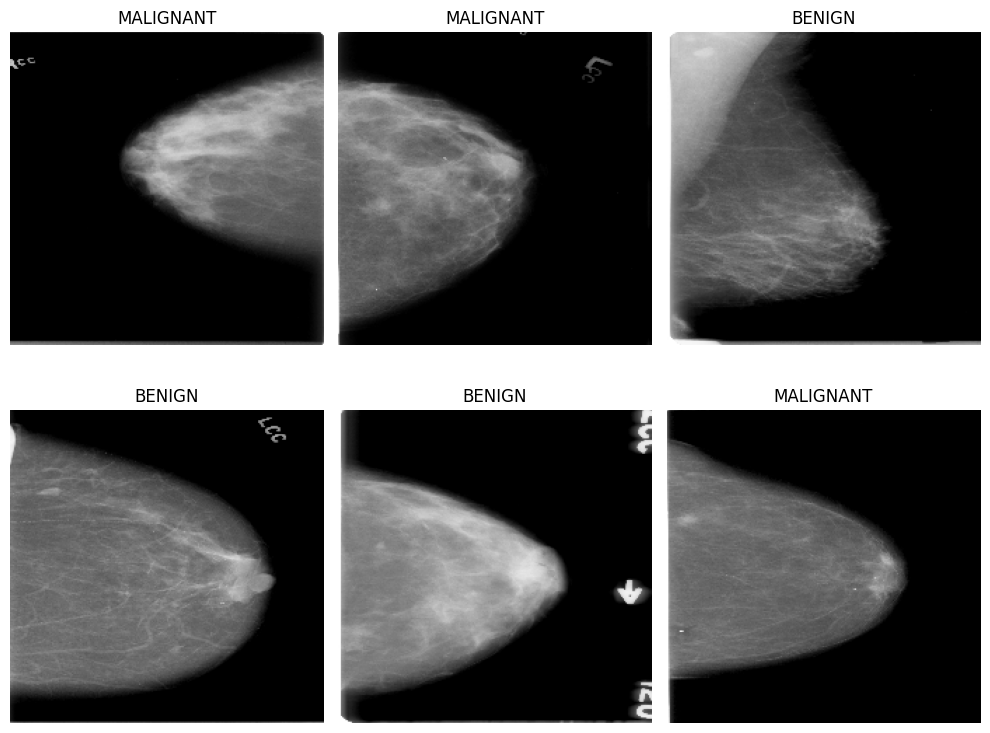

In [98]:
def display_images(images, titles, rows, cols, figsize=(10, 8)):
    """Display a grid of images with titles"""
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
        ax.set_title(titles[i])
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Select a sample
sample_images = X_train[:6]
sample_labels = np.argmax(y_train[:6], axis=1)  # Convert one-hot to class index

# Titles
class_names = ['BENIGN', 'MALIGNANT', 'BENIGN_WITHOUT_CALLBACK']
image_titles = [class_names[label] for label in sample_labels]

# Display
display_images(sample_images, image_titles, 2, 3)

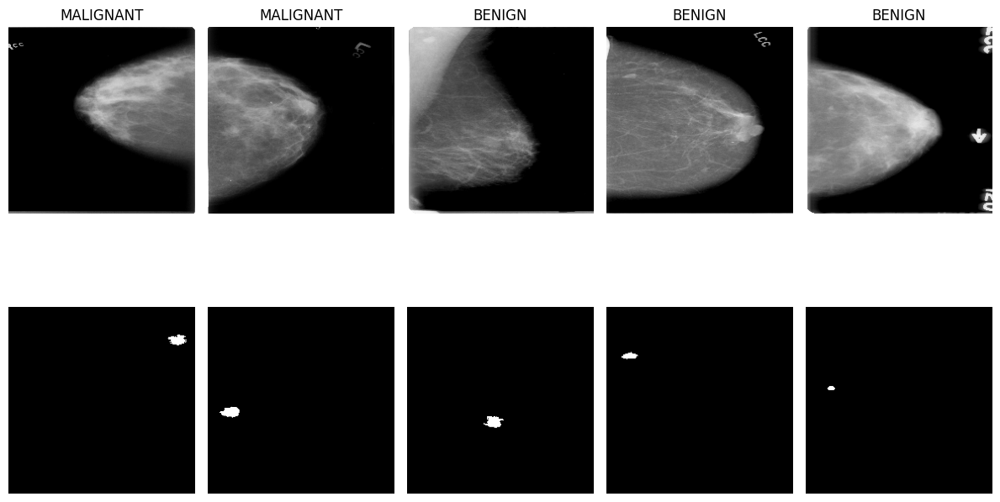

In [101]:
def display_images_and_masks(images, masks, titles=None, figsize=(12, 8)):
    """Display each image and its corresponding mask in two rows"""
    num_images = len(images)
    fig, axes = plt.subplots(2, num_images, figsize=figsize)

    for i in range(num_images):
        # Top row: Original images
        axes[0, i].imshow(images[i])
        if titles:
            axes[0, i].set_title(titles[i])
        axes[0, i].axis('off')
        
        # Bottom row: Masks
        axes[1, i].imshow(masks[i], cmap='gray')
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()
    
# Select samples
num_samples = 5
sample_images = X_train[:num_samples]
sample_masks = y_train_masks[:num_samples]  # Your masks as 2D arrays

# Optional: Class titles
sample_labels = np.argmax(y_train[:num_samples], axis=1)
class_names = ['BENIGN', 'MALIGNANT', 'BENIGN_WITHOUT_CALLBACK']
titles = [class_names[label] for label in sample_labels]

# Show the images and their corresponding masks
display_images_and_masks(sample_images, sample_masks, titles)


In [193]:
import tensorflow as tf
from tensorflow_examples.models.pix2pix import pix2pix

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

from IPython.display import clear_output
import matplotlib.pyplot as plt

In [194]:
OUTPUT_CHANNELS = 3

In [195]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[224, 224, 3], include_top=False)
# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)
down_stack.trainable = False

In [196]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [197]:
def unet_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[224, 224, 3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)
  return tf.keras.Model(inputs=inputs, outputs=x)

In [198]:
model = unet_model(OUTPUT_CHANNELS)
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [199]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [200]:
def show_predictions(dataset=None, num=1):
  sample_image = X_train[0]  # Get one image
  sample_mask = y_train_masks[0]     # Get its mask
  sample_image = tf.expand_dims(sample_image, 0)  # Add batch dim

  pred_mask = model.predict(sample_image)
  display([sample_image[0], sample_mask, create_mask(pred_mask)])

In [201]:
def display(display_list):
    """Displays the image, ground truth mask, and predicted mask."""
    plt.figure(figsize=(15, 5))
    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i + 1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]), cmap='gray' if i > 0 else None)
        plt.axis('off')
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step


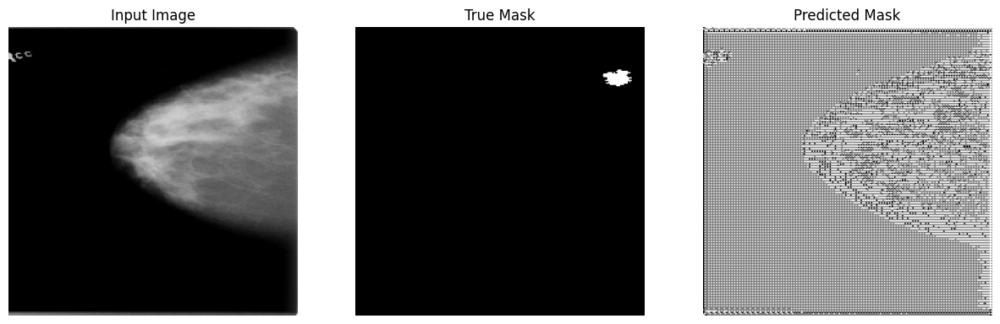

In [202]:
show_predictions()

In [203]:
def show_predictions(X_test, y_test_masks, num=1):
    for i in range(num):
        image = X_test[i]
        mask = y_test_masks[i]
        pred_mask = model.predict(image[tf.newaxis, ...])
        display([image, mask, create_mask(pred_mask)])

In [204]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

In [205]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000

# Make sure both X_train_resized and y_train_masks are NumPy arrays of correct shape
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train_masks))
train_dataset = train_dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test_masks))
test_dataset = test_dataset.batch(BATCH_SIZE)

In [206]:
EPOCHS = 50
STEPS_PER_EPOCH = len(X_train) // BATCH_SIZE
VALIDATION_STEPS = len(X_test) // BATCH_SIZE

In [207]:
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"\nSample prediction after epoch {epoch + 1}")
        show_predictions(X_test, y_test_masks, num=1)

Epoch 1/50


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step - accuracy: 0.6668 - loss: 0.7192
Sample prediction after epoch 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


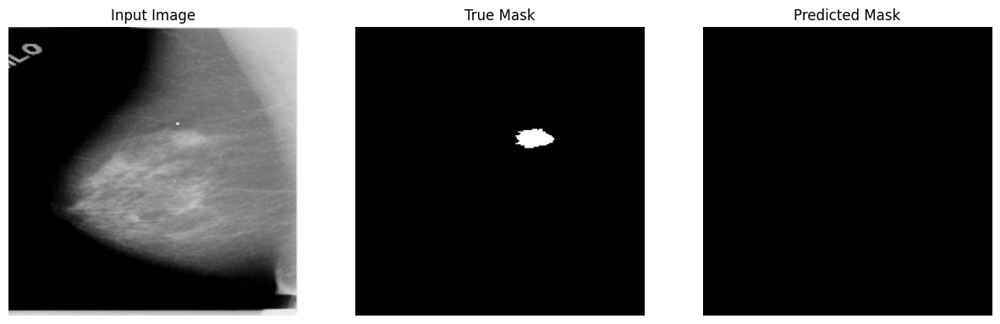

27/27 ━━━━━━━━━━━━━━━━━━━━ 14s 373ms/step - accuracy: 0.6740 - loss: 0.7048 - val_accuracy: 0.9946 - val_loss: 0.0437
Epoch 2/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step - accuracy: 0.9945 - loss: 0.0404
Sample prediction after epoch 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


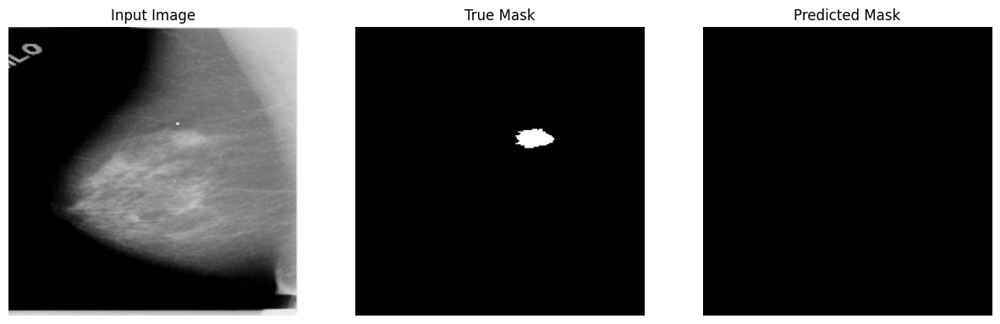

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 336ms/step - accuracy: 0.9945 - loss: 0.0403 - val_accuracy: 0.9946 - val_loss: 0.0351
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - accuracy: 0.9951 - loss: 0.0303
Sample prediction after epoch 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


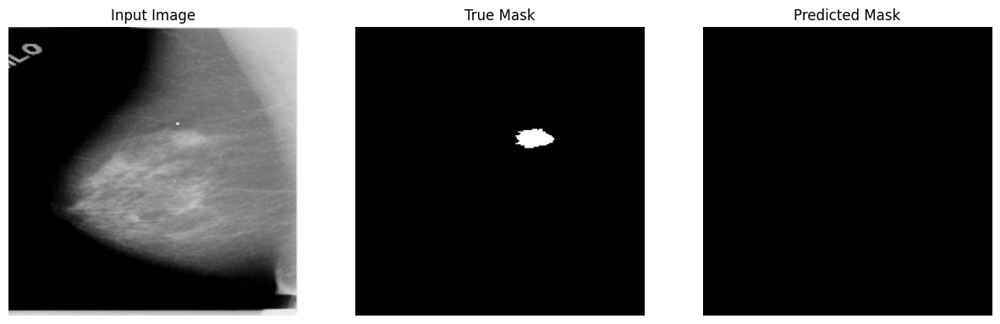

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 326ms/step - accuracy: 0.9951 - loss: 0.0303 - val_accuracy: 0.9945 - val_loss: 0.0305
Epoch 4/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step - accuracy: 0.9942 - loss: 0.0319
Sample prediction after epoch 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


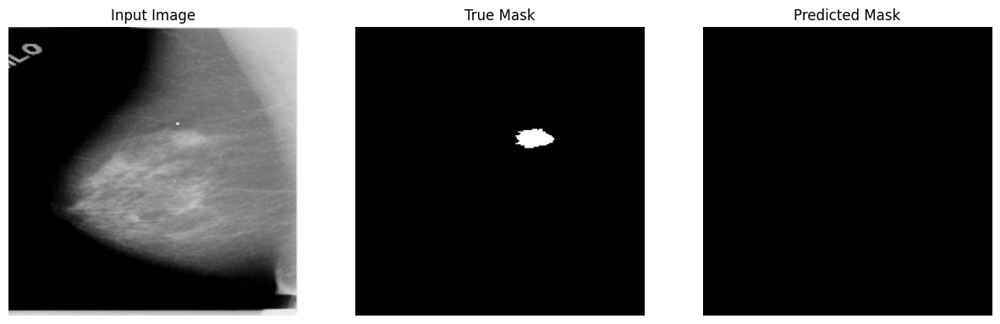

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 331ms/step - accuracy: 0.9942 - loss: 0.0318 - val_accuracy: 0.9946 - val_loss: 0.0288
Epoch 5/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step - accuracy: 0.9949 - loss: 0.0257
Sample prediction after epoch 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


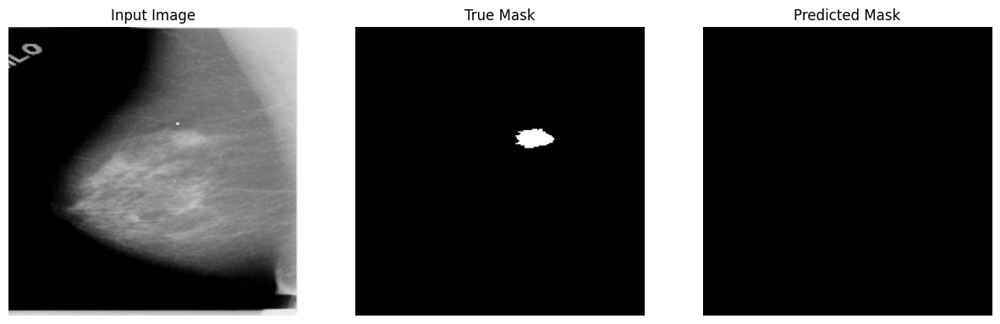

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 321ms/step - accuracy: 0.9949 - loss: 0.0257 - val_accuracy: 0.9946 - val_loss: 0.0275
Epoch 6/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - accuracy: 0.9949 - loss: 0.0223
Sample prediction after epoch 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


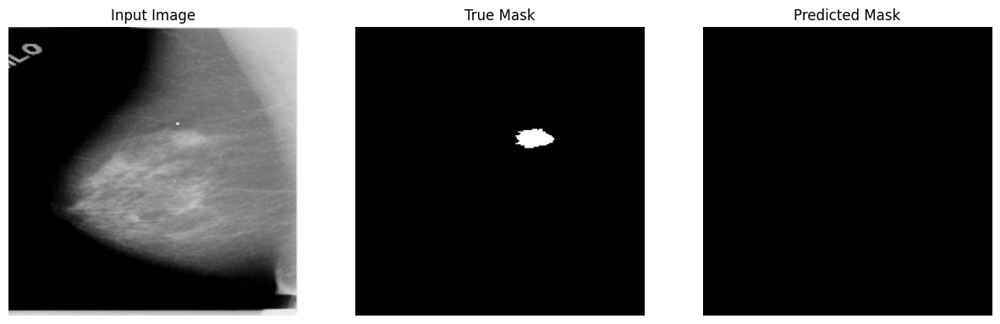

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 322ms/step - accuracy: 0.9949 - loss: 0.0222 - val_accuracy: 0.9946 - val_loss: 0.0267
Epoch 7/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - accuracy: 0.9950 - loss: 0.0190
Sample prediction after epoch 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


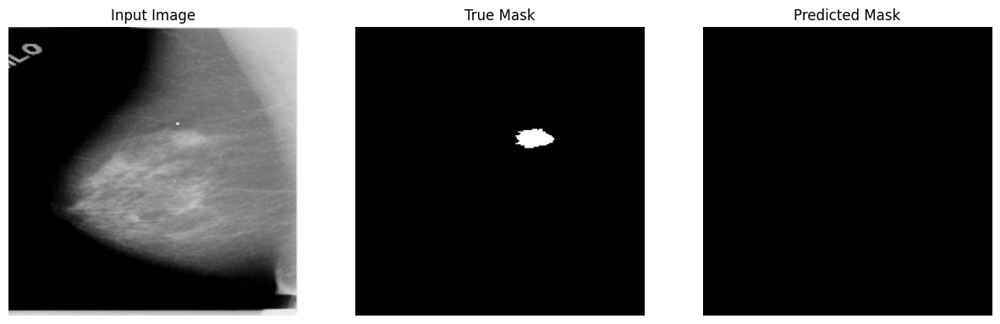

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 326ms/step - accuracy: 0.9950 - loss: 0.0190 - val_accuracy: 0.9946 - val_loss: 0.0256
Epoch 8/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - accuracy: 0.9953 - loss: 0.0169
Sample prediction after epoch 8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


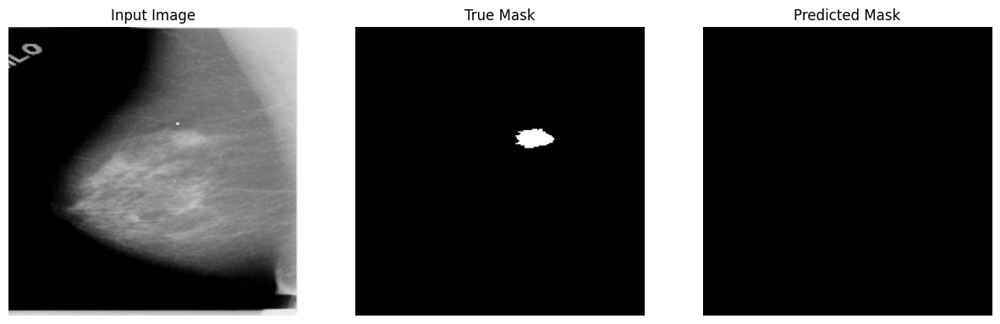

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 325ms/step - accuracy: 0.9953 - loss: 0.0169 - val_accuracy: 0.9946 - val_loss: 0.0254
Epoch 9/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - accuracy: 0.9951 - loss: 0.0165
Sample prediction after epoch 9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


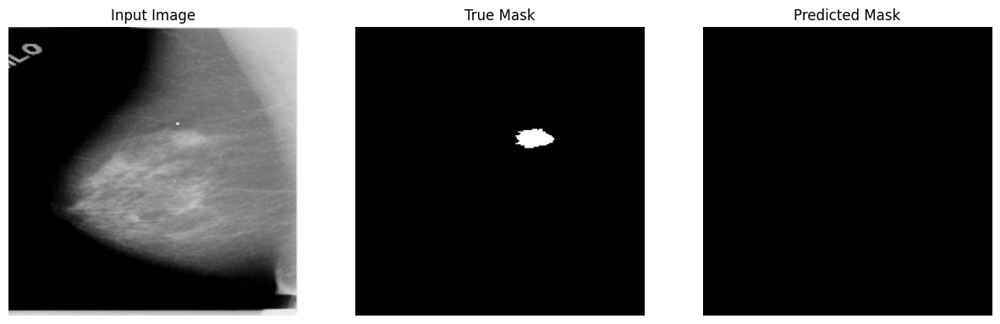

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 331ms/step - accuracy: 0.9951 - loss: 0.0165 - val_accuracy: 0.9946 - val_loss: 0.0230
Epoch 10/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - accuracy: 0.9952 - loss: 0.0153
Sample prediction after epoch 10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


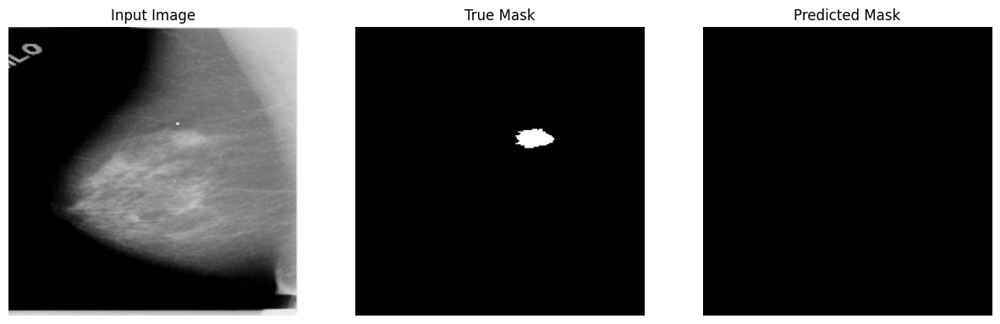

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 327ms/step - accuracy: 0.9952 - loss: 0.0152 - val_accuracy: 0.9946 - val_loss: 0.0231
Epoch 11/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step - accuracy: 0.9955 - loss: 0.0144
Sample prediction after epoch 11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


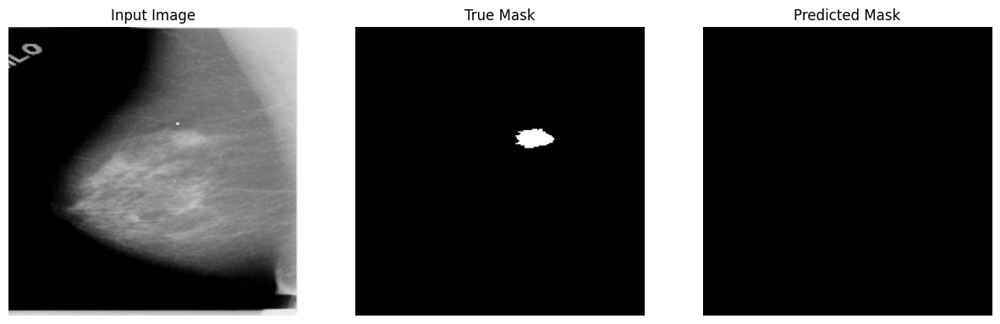

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 321ms/step - accuracy: 0.9955 - loss: 0.0144 - val_accuracy: 0.9946 - val_loss: 0.0198
Epoch 12/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - accuracy: 0.9953 - loss: 0.0143
Sample prediction after epoch 12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


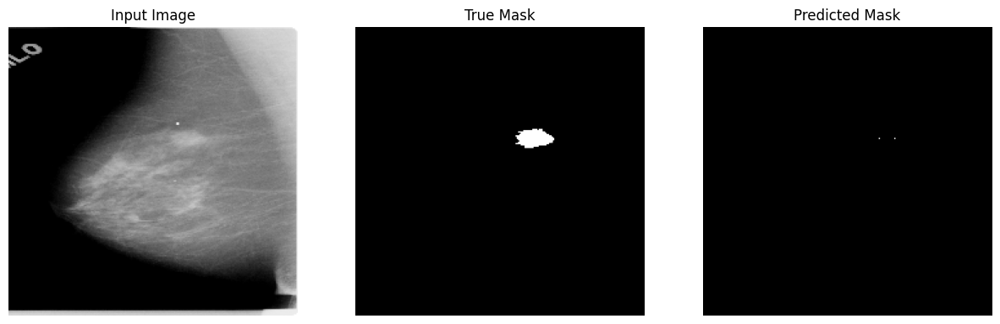

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 349ms/step - accuracy: 0.9953 - loss: 0.0143 - val_accuracy: 0.9947 - val_loss: 0.0188
Epoch 13/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step - accuracy: 0.9960 - loss: 0.0122
Sample prediction after epoch 13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


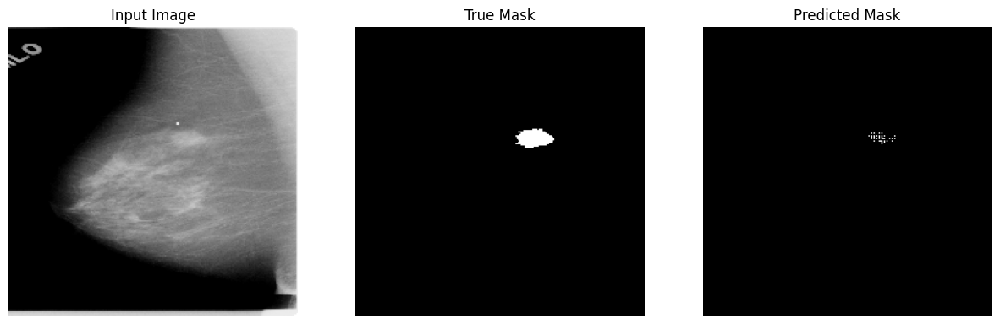

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 325ms/step - accuracy: 0.9960 - loss: 0.0122 - val_accuracy: 0.9948 - val_loss: 0.0187
Epoch 14/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - accuracy: 0.9953 - loss: 0.0137
Sample prediction after epoch 14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


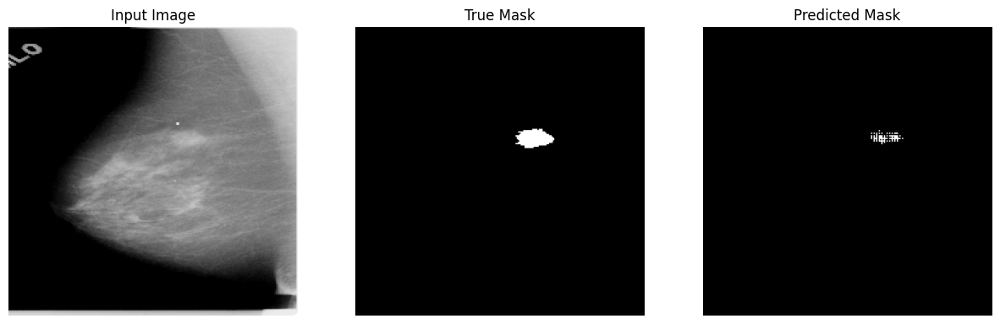

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 322ms/step - accuracy: 0.9954 - loss: 0.0137 - val_accuracy: 0.9949 - val_loss: 0.0182
Epoch 15/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step - accuracy: 0.9957 - loss: 0.0124
Sample prediction after epoch 15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


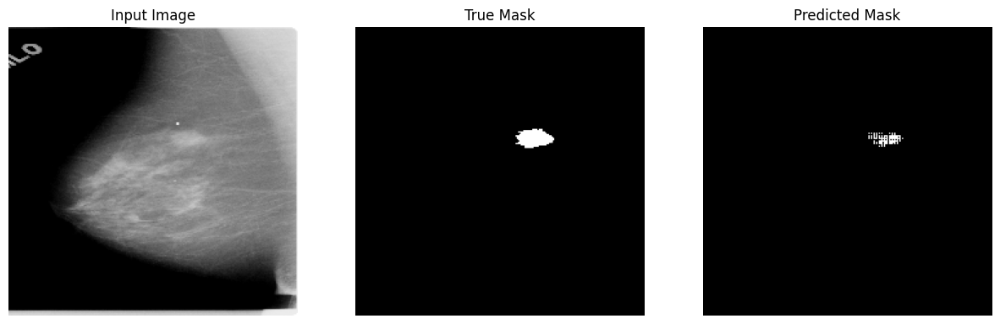

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 322ms/step - accuracy: 0.9957 - loss: 0.0124 - val_accuracy: 0.9950 - val_loss: 0.0178
Epoch 16/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step - accuracy: 0.9959 - loss: 0.0120
Sample prediction after epoch 16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


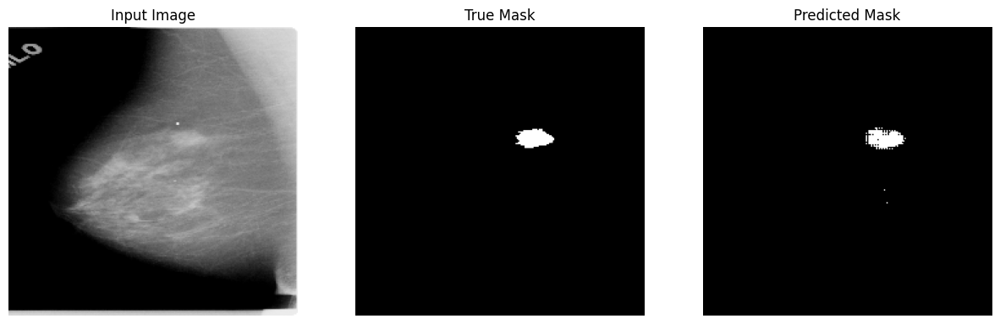

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 322ms/step - accuracy: 0.9958 - loss: 0.0120 - val_accuracy: 0.9945 - val_loss: 0.0175
Epoch 17/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - accuracy: 0.9958 - loss: 0.0119
Sample prediction after epoch 17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


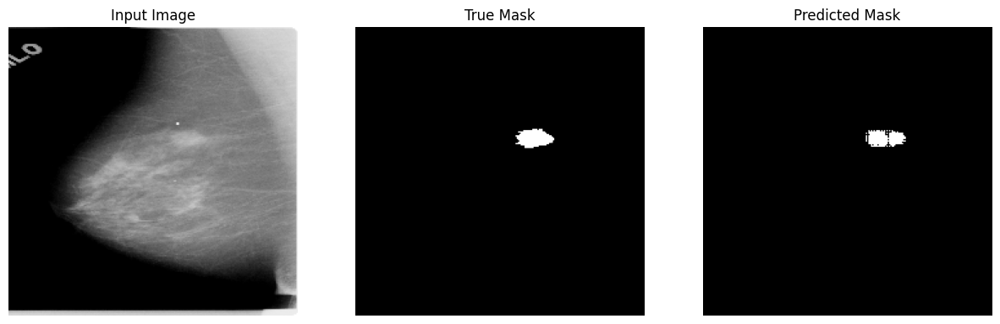

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 322ms/step - accuracy: 0.9958 - loss: 0.0119 - val_accuracy: 0.9945 - val_loss: 0.0172
Epoch 18/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step - accuracy: 0.9961 - loss: 0.0112
Sample prediction after epoch 18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


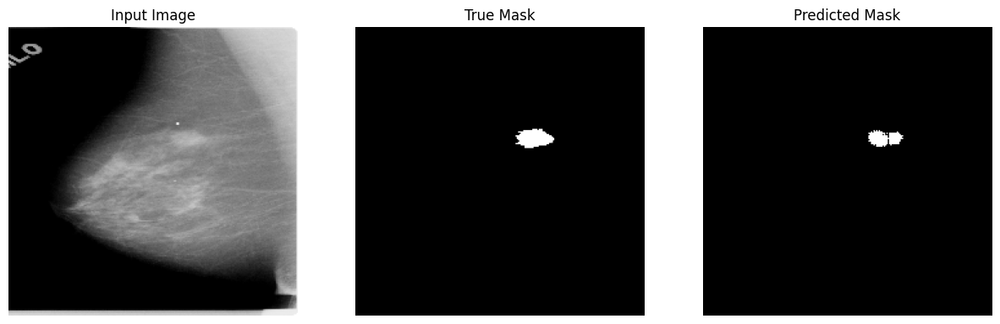

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 322ms/step - accuracy: 0.9961 - loss: 0.0112 - val_accuracy: 0.9950 - val_loss: 0.0169
Epoch 19/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step - accuracy: 0.9962 - loss: 0.0109
Sample prediction after epoch 19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


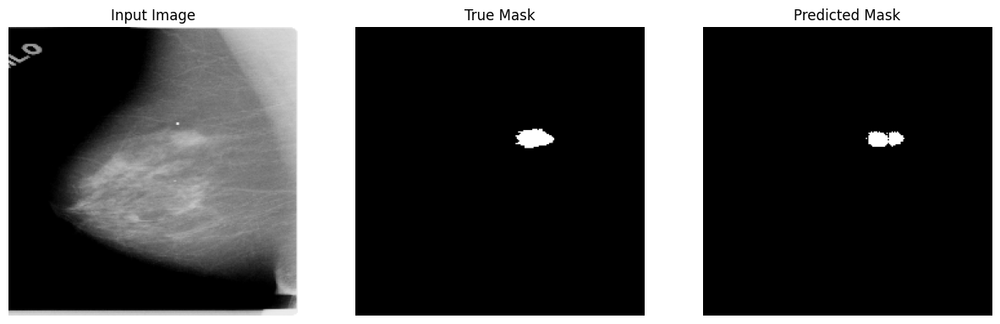

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 322ms/step - accuracy: 0.9962 - loss: 0.0109 - val_accuracy: 0.9950 - val_loss: 0.0173
Epoch 20/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - accuracy: 0.9961 - loss: 0.0108
Sample prediction after epoch 20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


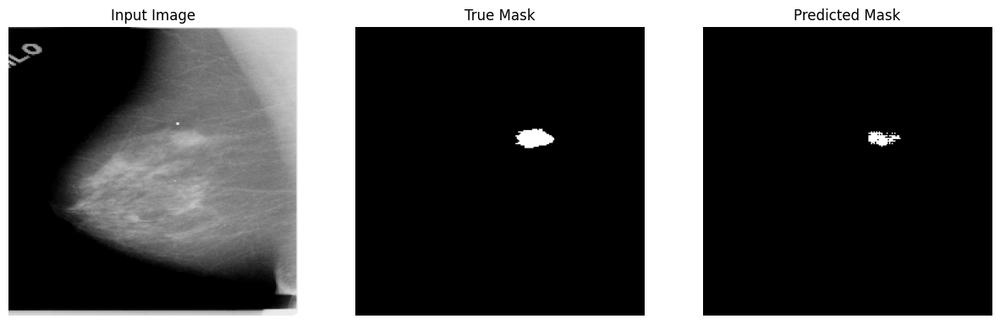

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 327ms/step - accuracy: 0.9961 - loss: 0.0108 - val_accuracy: 0.9950 - val_loss: 0.0187
Epoch 21/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - accuracy: 0.9964 - loss: 0.0099
Sample prediction after epoch 21
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


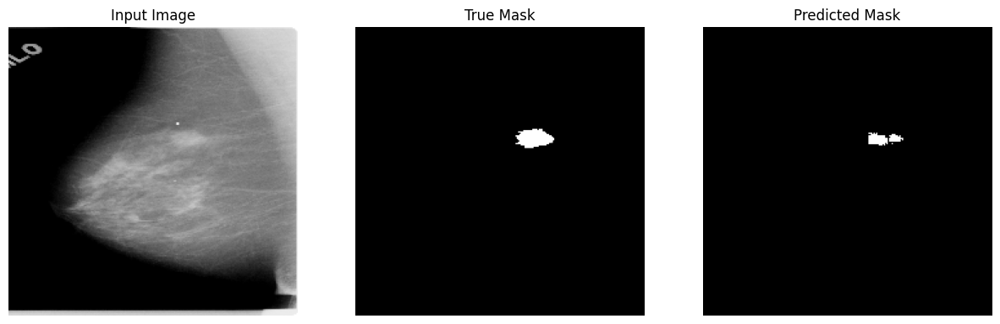

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 328ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.9949 - val_loss: 0.0210
Epoch 22/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - accuracy: 0.9964 - loss: 0.0099
Sample prediction after epoch 22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


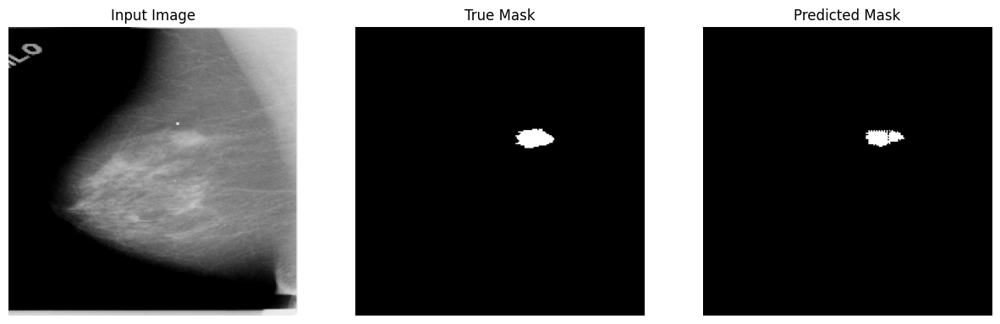

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 325ms/step - accuracy: 0.9964 - loss: 0.0099 - val_accuracy: 0.9950 - val_loss: 0.0196
Epoch 23/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - accuracy: 0.9966 - loss: 0.0094
Sample prediction after epoch 23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


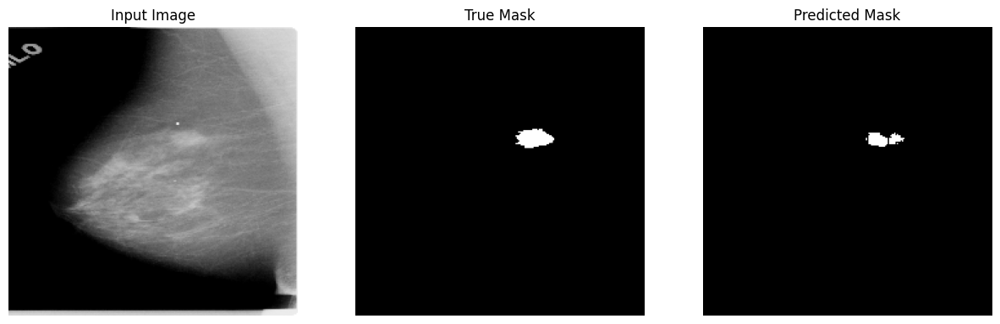

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 327ms/step - accuracy: 0.9966 - loss: 0.0094 - val_accuracy: 0.9950 - val_loss: 0.0189
Epoch 24/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step - accuracy: 0.9969 - loss: 0.0085
Sample prediction after epoch 24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


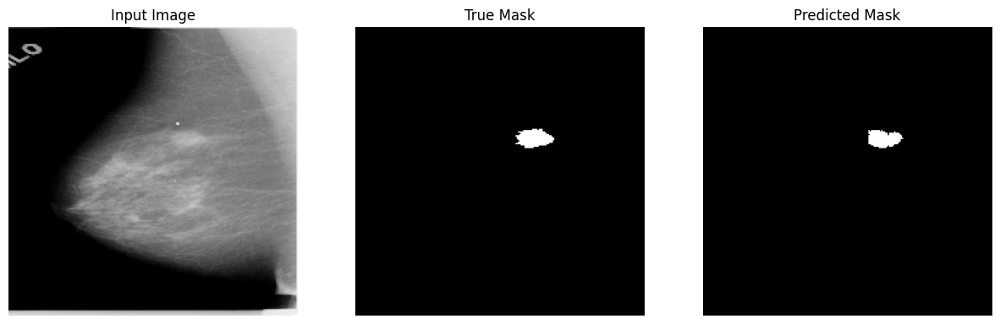

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 326ms/step - accuracy: 0.9969 - loss: 0.0085 - val_accuracy: 0.9949 - val_loss: 0.0182
Epoch 25/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step - accuracy: 0.9969 - loss: 0.0082
Sample prediction after epoch 25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


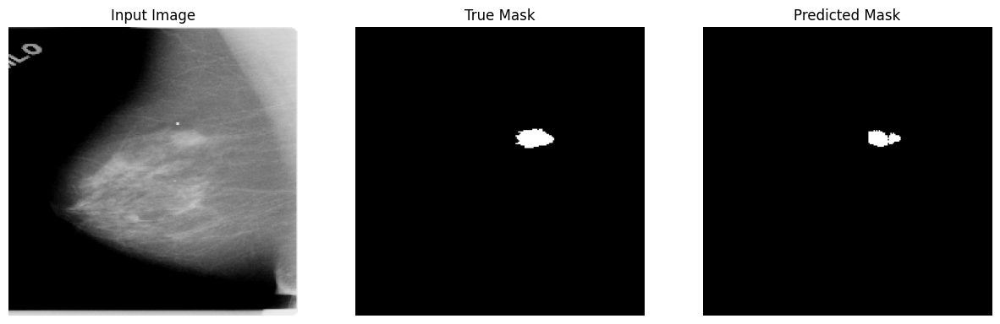

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 319ms/step - accuracy: 0.9969 - loss: 0.0082 - val_accuracy: 0.9949 - val_loss: 0.0196
Epoch 26/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step - accuracy: 0.9970 - loss: 0.0079
Sample prediction after epoch 26
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


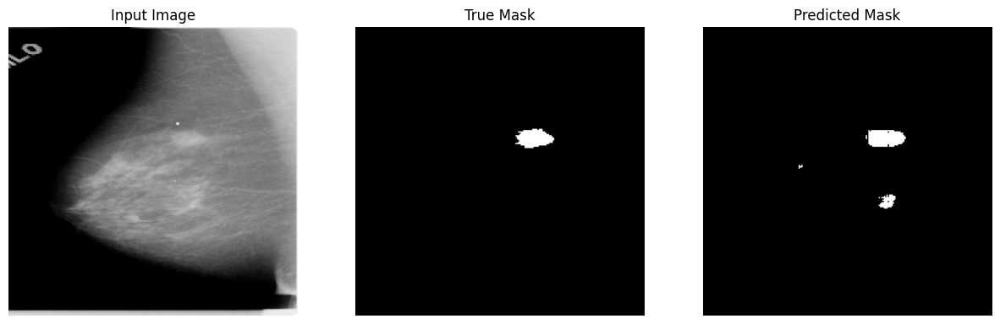

27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 318ms/step - accuracy: 0.9970 - loss: 0.0079 - val_accuracy: 0.9942 - val_loss: 0.0190
Epoch 27/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.9971 - loss: 0.0079
Sample prediction after epoch 27
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


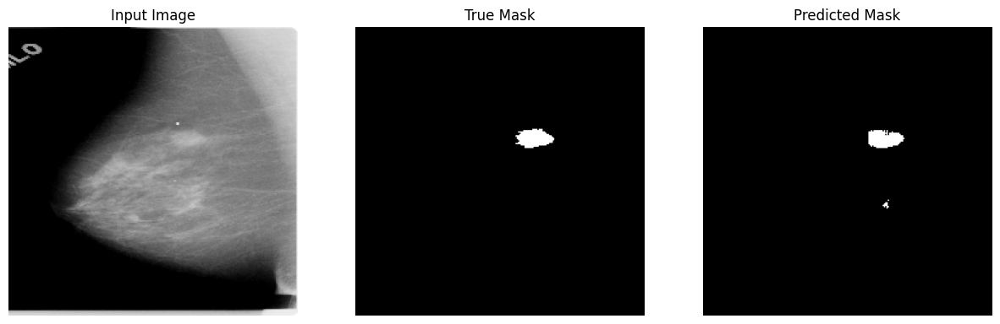

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 301ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.9947 - val_loss: 0.0185
Epoch 28/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.9971 - loss: 0.0074
Sample prediction after epoch 28
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


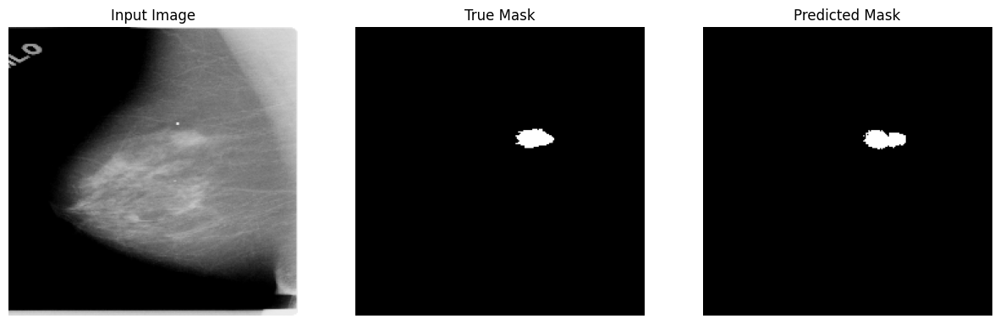

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 303ms/step - accuracy: 0.9971 - loss: 0.0074 - val_accuracy: 0.9945 - val_loss: 0.0193
Epoch 29/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9973 - loss: 0.0069
Sample prediction after epoch 29
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


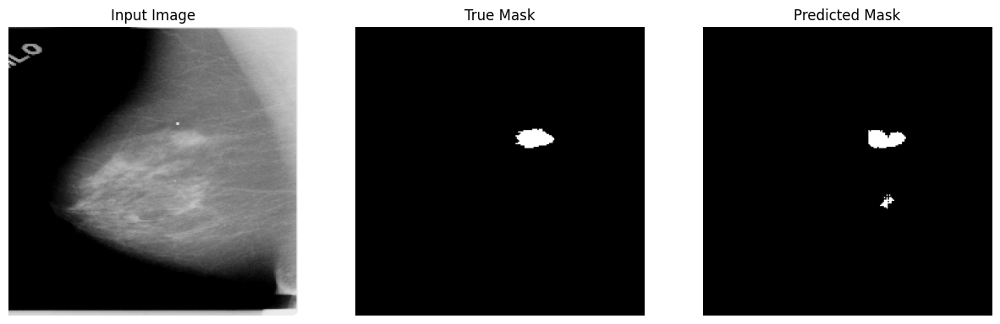

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 306ms/step - accuracy: 0.9973 - loss: 0.0069 - val_accuracy: 0.9948 - val_loss: 0.0194
Epoch 30/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.9976 - loss: 0.0063
Sample prediction after epoch 30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


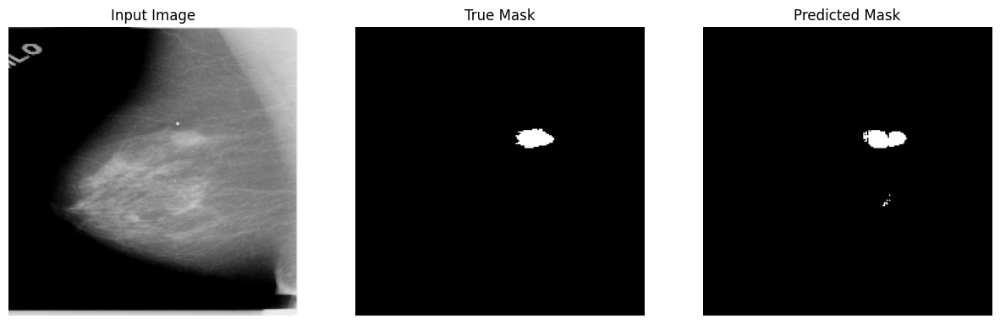

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 312ms/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.9947 - val_loss: 0.0191
Epoch 31/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.9973 - loss: 0.0067
Sample prediction after epoch 31
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


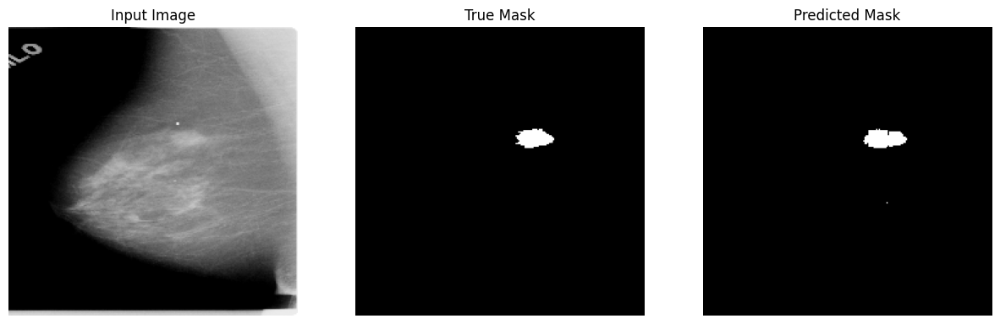

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 309ms/step - accuracy: 0.9973 - loss: 0.0067 - val_accuracy: 0.9946 - val_loss: 0.0200
Epoch 32/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step - accuracy: 0.9977 - loss: 0.0059
Sample prediction after epoch 32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


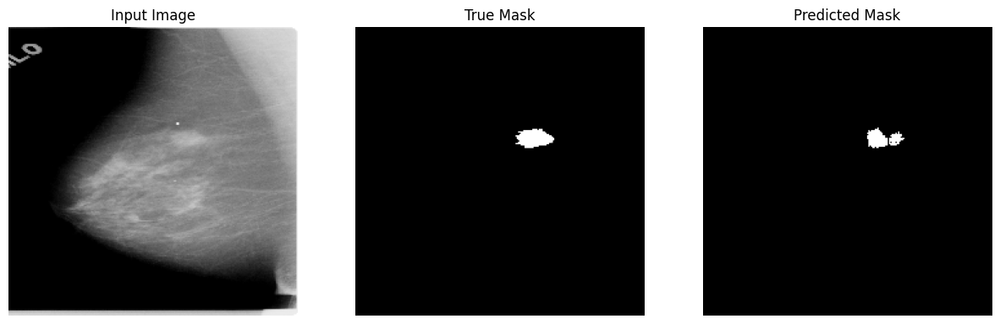

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 311ms/step - accuracy: 0.9977 - loss: 0.0059 - val_accuracy: 0.9948 - val_loss: 0.0205
Epoch 33/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.9975 - loss: 0.0060
Sample prediction after epoch 33
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


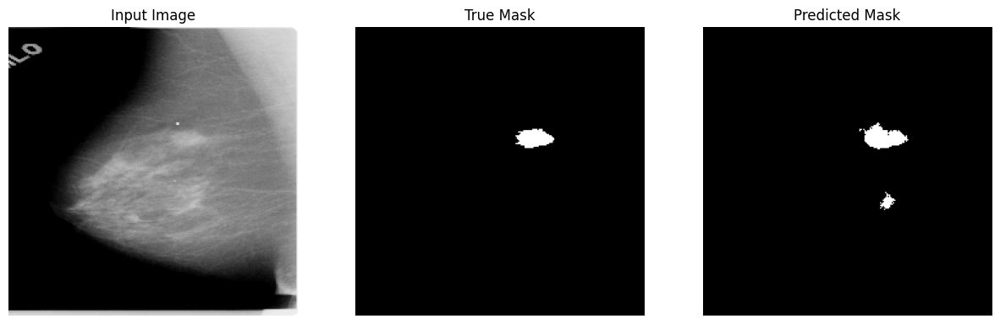

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 304ms/step - accuracy: 0.9975 - loss: 0.0060 - val_accuracy: 0.9939 - val_loss: 0.0209
Epoch 34/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.9976 - loss: 0.0059
Sample prediction after epoch 34
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


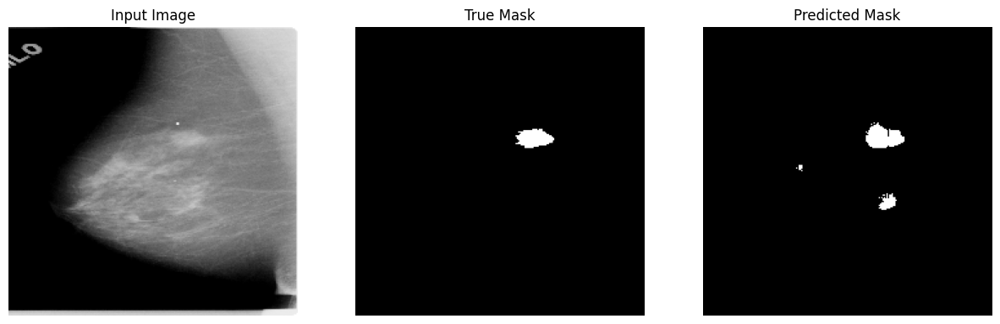

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 305ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.9934 - val_loss: 0.0226
Epoch 35/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - accuracy: 0.9978 - loss: 0.0054
Sample prediction after epoch 35
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


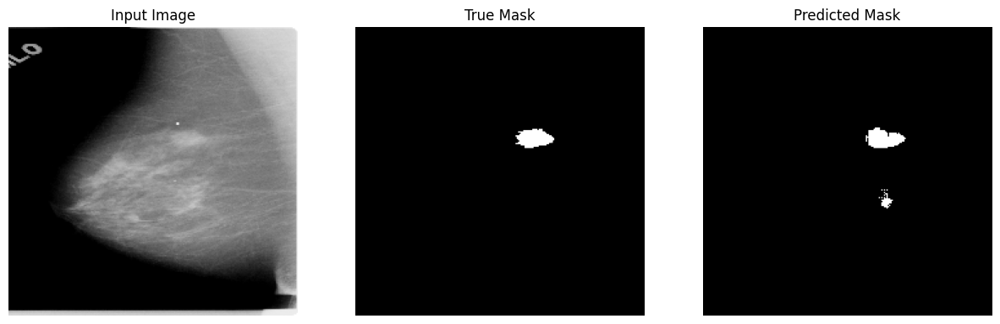

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 313ms/step - accuracy: 0.9978 - loss: 0.0054 - val_accuracy: 0.9946 - val_loss: 0.0207
Epoch 36/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.9978 - loss: 0.0053
Sample prediction after epoch 36
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


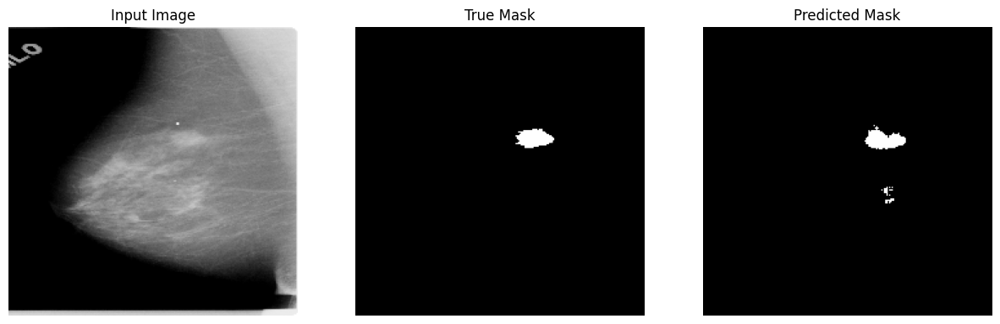

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 309ms/step - accuracy: 0.9978 - loss: 0.0053 - val_accuracy: 0.9940 - val_loss: 0.0217
Epoch 37/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.9976 - loss: 0.0058
Sample prediction after epoch 37
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


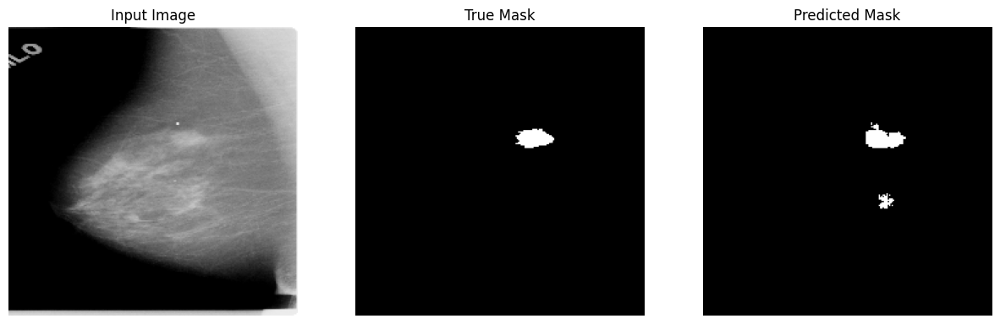

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 305ms/step - accuracy: 0.9976 - loss: 0.0058 - val_accuracy: 0.9944 - val_loss: 0.0215
Epoch 38/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.9980 - loss: 0.0047
Sample prediction after epoch 38
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


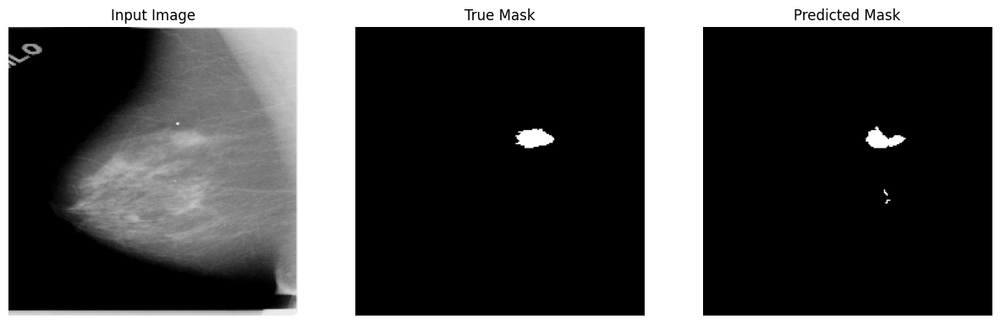

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 302ms/step - accuracy: 0.9980 - loss: 0.0047 - val_accuracy: 0.9949 - val_loss: 0.0234
Epoch 39/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.9978 - loss: 0.0050
Sample prediction after epoch 39
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


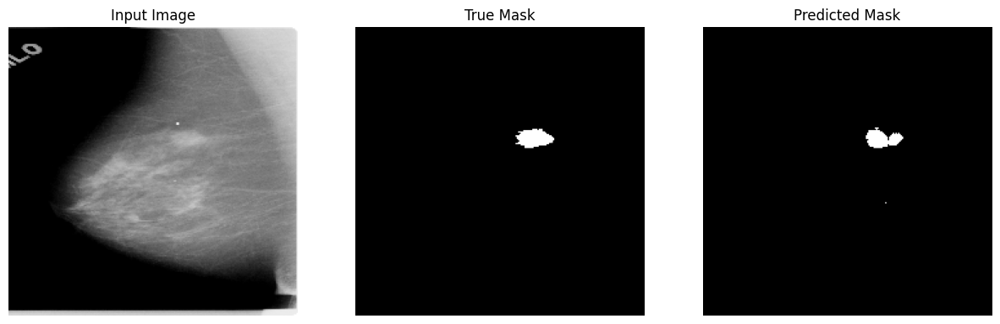

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 306ms/step - accuracy: 0.9978 - loss: 0.0050 - val_accuracy: 0.9947 - val_loss: 0.0210
Epoch 40/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.9983 - loss: 0.0040
Sample prediction after epoch 40
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


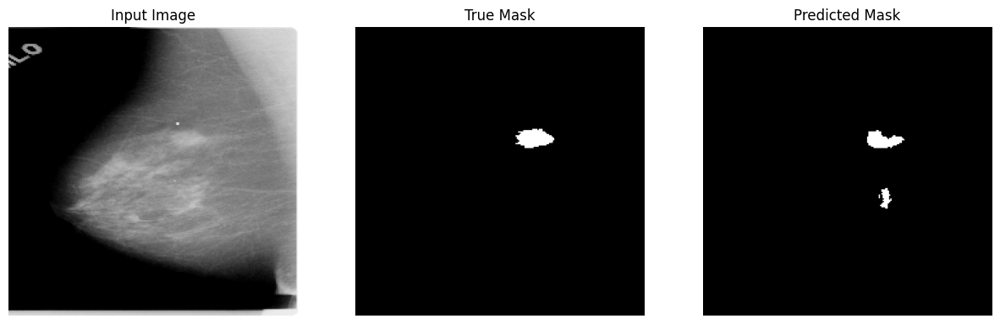

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 305ms/step - accuracy: 0.9983 - loss: 0.0040 - val_accuracy: 0.9947 - val_loss: 0.0225
Epoch 41/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.9981 - loss: 0.0044
Sample prediction after epoch 41
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


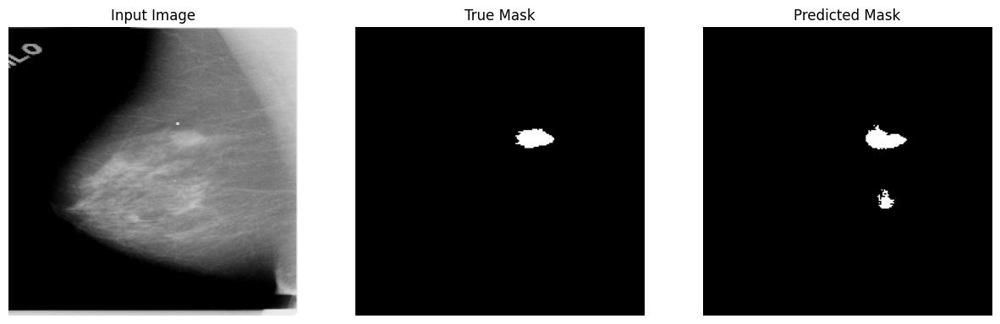

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 302ms/step - accuracy: 0.9981 - loss: 0.0044 - val_accuracy: 0.9946 - val_loss: 0.0225
Epoch 42/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.9981 - loss: 0.0043
Sample prediction after epoch 42
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


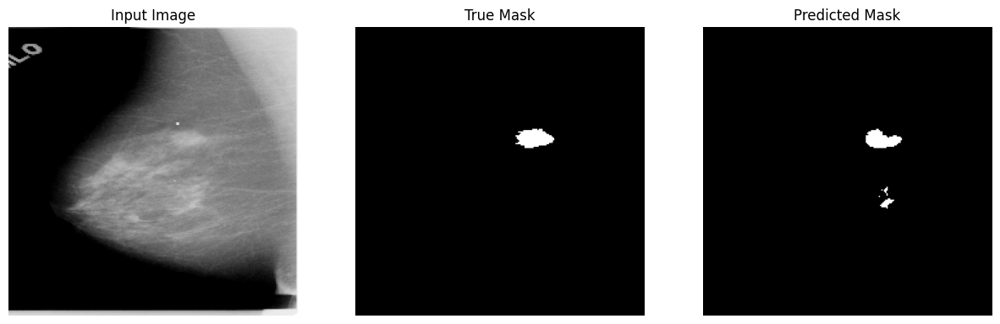

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 302ms/step - accuracy: 0.9981 - loss: 0.0043 - val_accuracy: 0.9946 - val_loss: 0.0225
Epoch 43/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - accuracy: 0.9982 - loss: 0.0041
Sample prediction after epoch 43
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


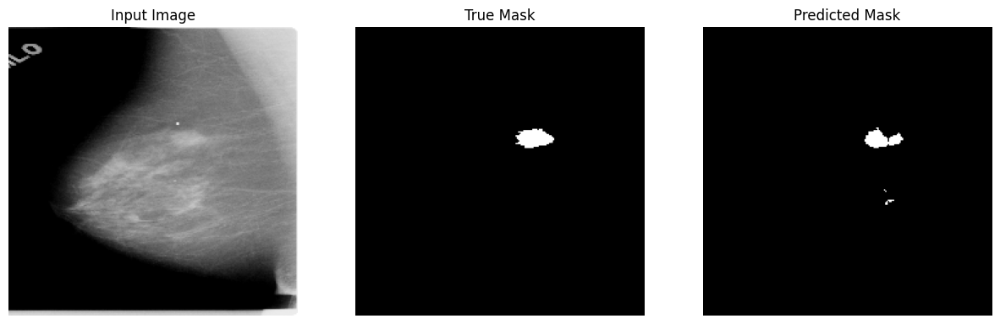

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 303ms/step - accuracy: 0.9982 - loss: 0.0041 - val_accuracy: 0.9947 - val_loss: 0.0227
Epoch 44/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.9984 - loss: 0.0035
Sample prediction after epoch 44
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


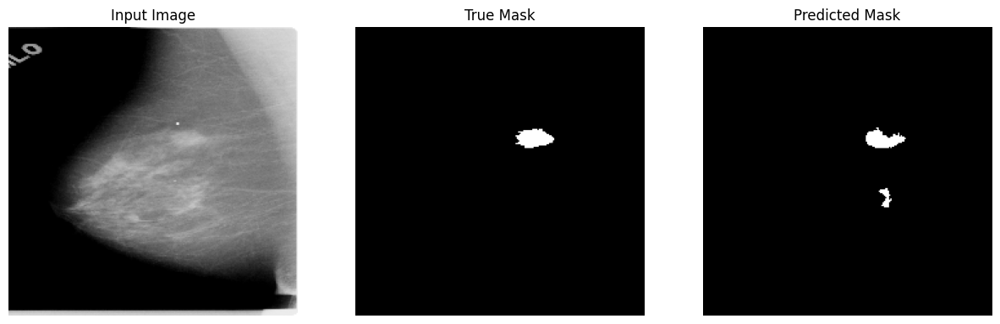

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 305ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.9946 - val_loss: 0.0237
Epoch 45/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.9982 - loss: 0.0039
Sample prediction after epoch 45
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


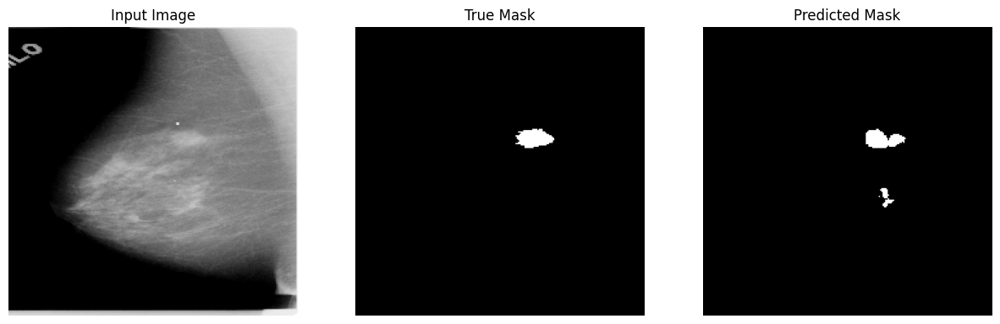

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 302ms/step - accuracy: 0.9982 - loss: 0.0039 - val_accuracy: 0.9945 - val_loss: 0.0242
Epoch 46/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.9983 - loss: 0.0038
Sample prediction after epoch 46
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


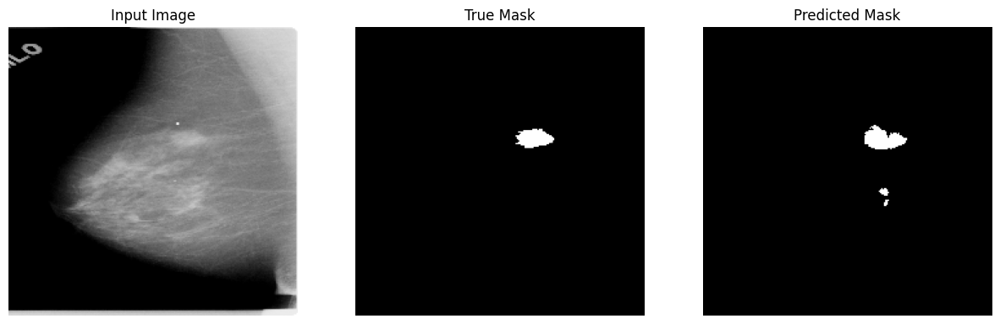

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 301ms/step - accuracy: 0.9983 - loss: 0.0038 - val_accuracy: 0.9945 - val_loss: 0.0252
Epoch 47/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.9983 - loss: 0.0037
Sample prediction after epoch 47
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


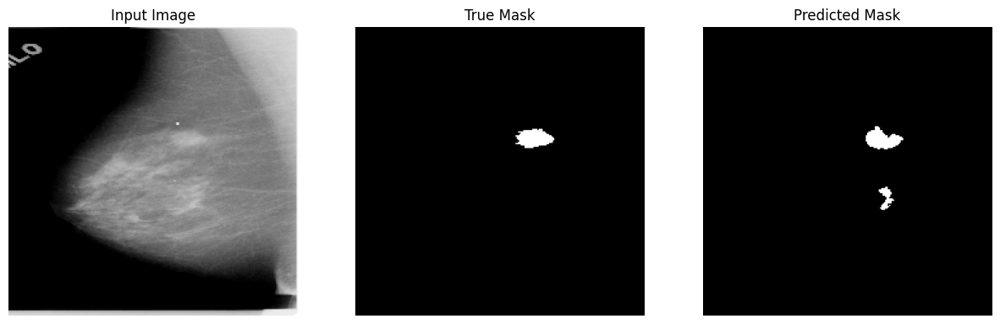

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 301ms/step - accuracy: 0.9983 - loss: 0.0037 - val_accuracy: 0.9946 - val_loss: 0.0252
Epoch 48/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - accuracy: 0.9984 - loss: 0.0035
Sample prediction after epoch 48
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


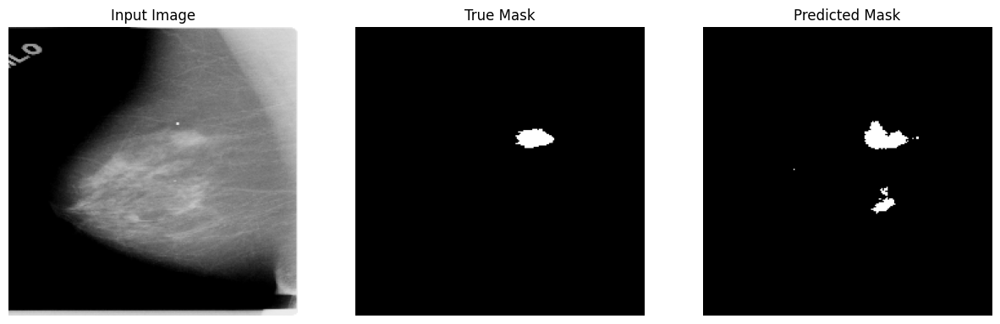

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 302ms/step - accuracy: 0.9984 - loss: 0.0035 - val_accuracy: 0.9932 - val_loss: 0.0259
Epoch 49/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.9984 - loss: 0.0034
Sample prediction after epoch 49
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


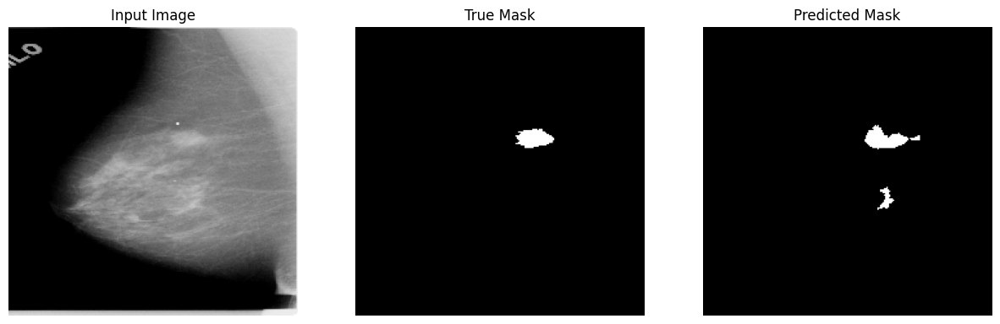

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 301ms/step - accuracy: 0.9984 - loss: 0.0034 - val_accuracy: 0.9944 - val_loss: 0.0257
Epoch 50/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.9985 - loss: 0.0031
Sample prediction after epoch 50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


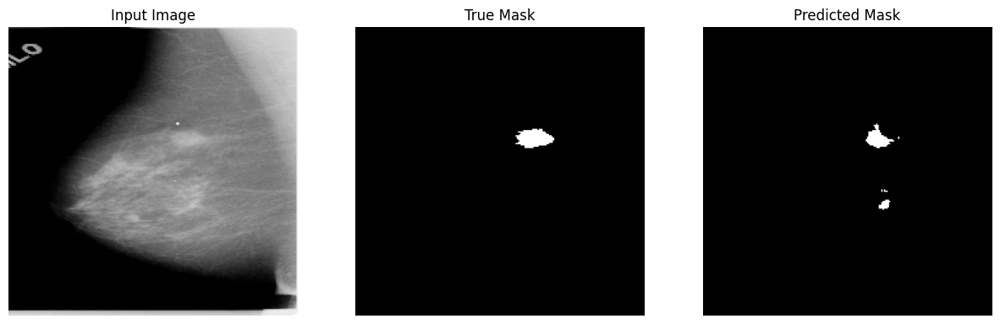

27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 301ms/step - accuracy: 0.9985 - loss: 0.0031 - val_accuracy: 0.9946 - val_loss: 0.0255


In [208]:
model_history = model.fit(train_dataset,
                          epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_data=test_dataset,
                          validation_steps=VALIDATION_STEPS,
                          callbacks=[DisplayCallback()])

In [212]:
def show_predictions(dataset, num=1):
    for images, masks in dataset.take(num):
        pred_masks = model.predict(images)
        for i in range(images.shape[0]):
            display([images[i], masks[i], create_mask(pred_masks[i][tf.newaxis, ...])])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


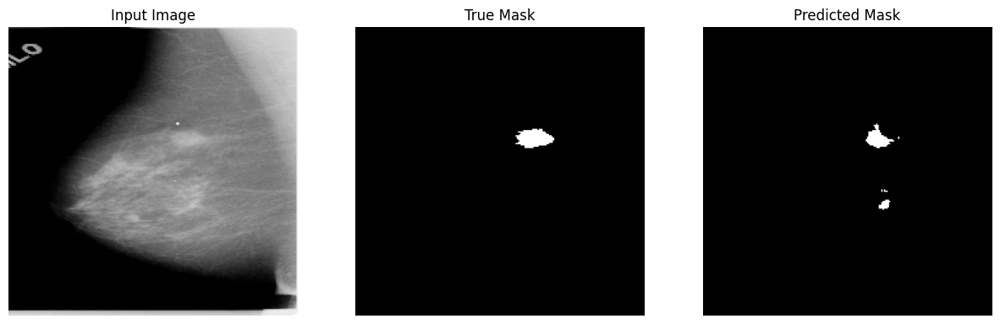

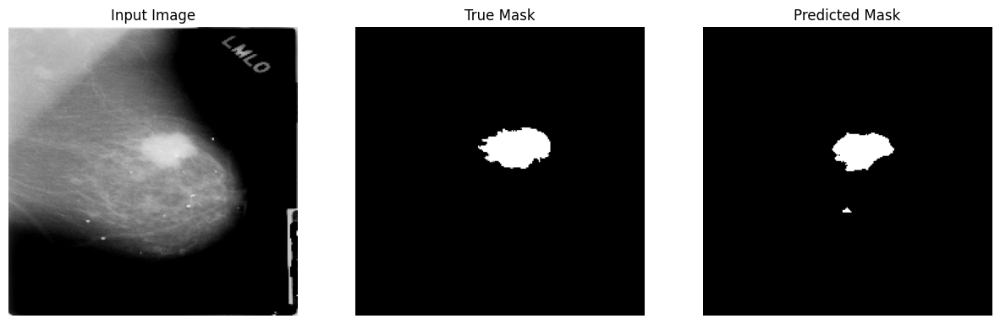

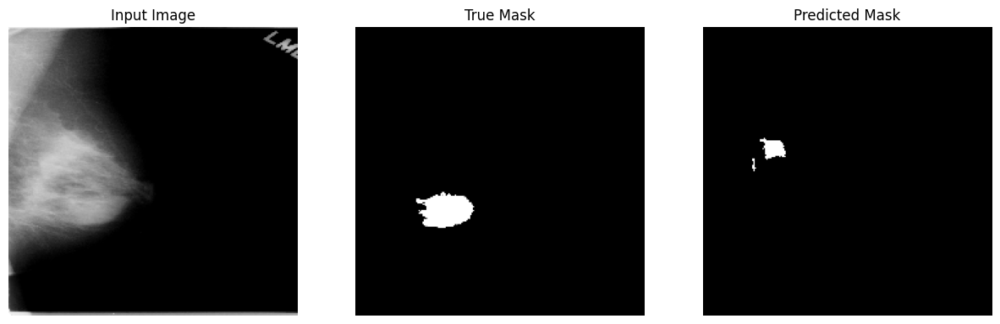

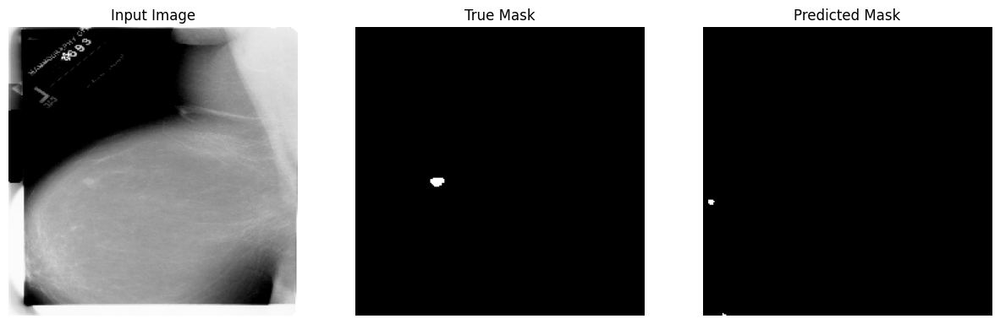

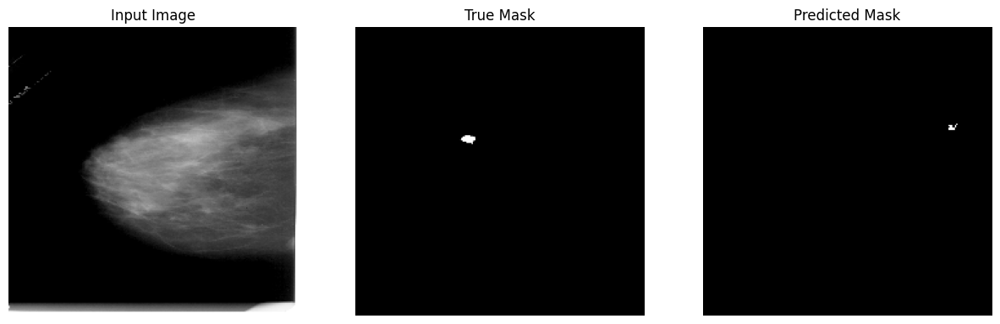

...

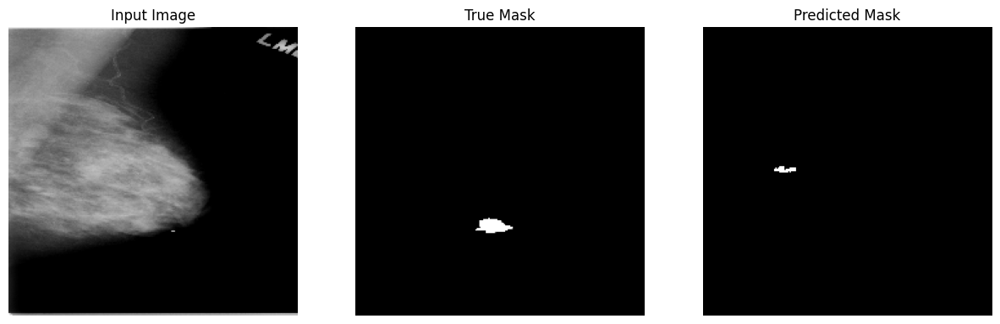

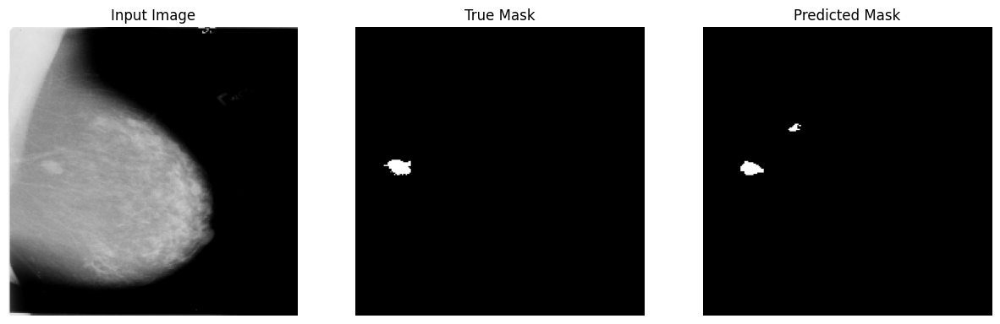

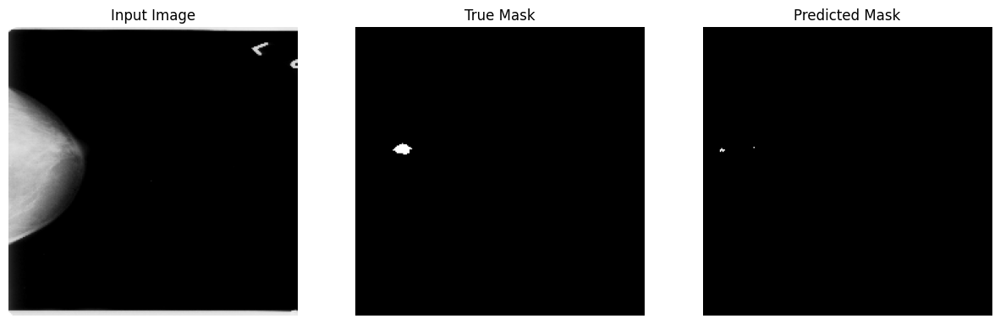

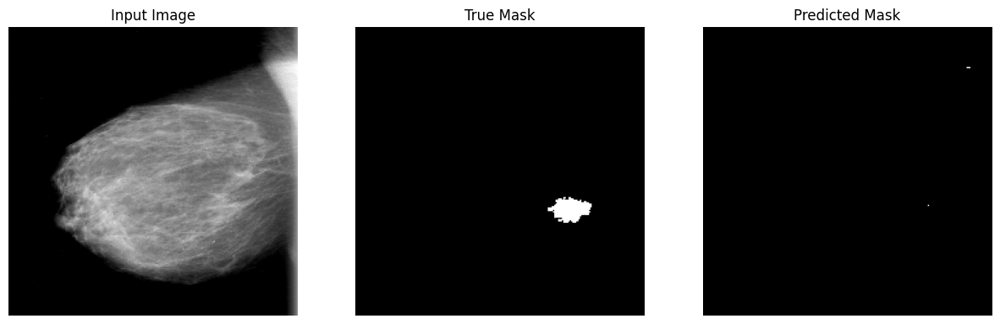

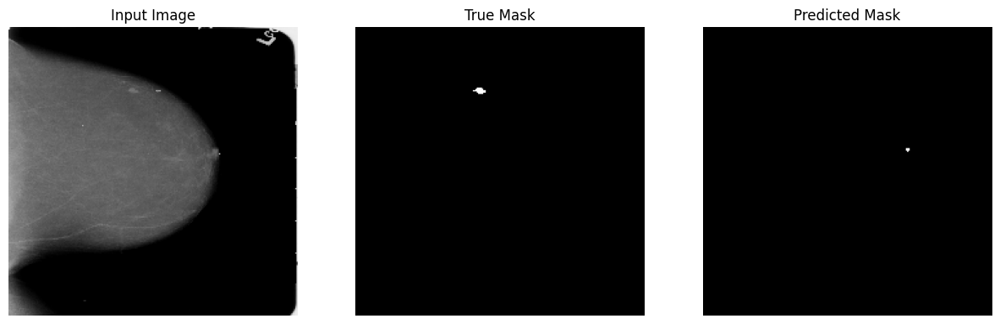

In [213]:
show_predictions(test_dataset, num=1)

In [221]:
# Get validation history
val_loss = model_history.history['val_loss']
val_accuracy = model_history.history['val_accuracy']

In [222]:
# Get training history
train_loss = model_history.history['loss']
train_accuracy = model_history.history['accuracy']

In [223]:
# Calculate overall training and validation loss and accuracy
overall_train_loss = np.mean(train_loss)
overall_train_accuracy = np.mean(train_accuracy)
overall_val_loss = np.mean(val_loss)
overall_val_accuracy = np.mean(val_accuracy)

# Print the overall accuracy
print("Overall Training Accuracy:", overall_train_accuracy)
print("Overall Validation Accuracy:", overall_val_accuracy)

Overall Training Accuracy: 0.9942362129688262
Overall Validation Accuracy: 0.9945873439311981


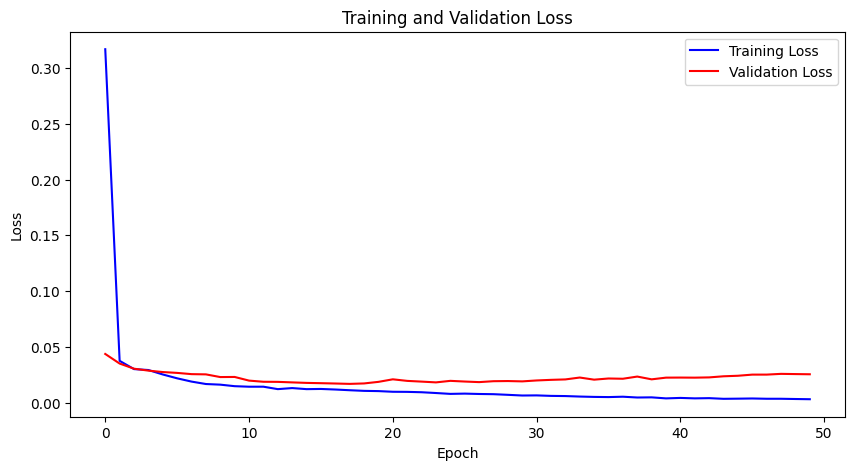

In [224]:
# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Training Loss', color='blue')
plt.plot(val_loss, label='Validation Loss', color='red')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

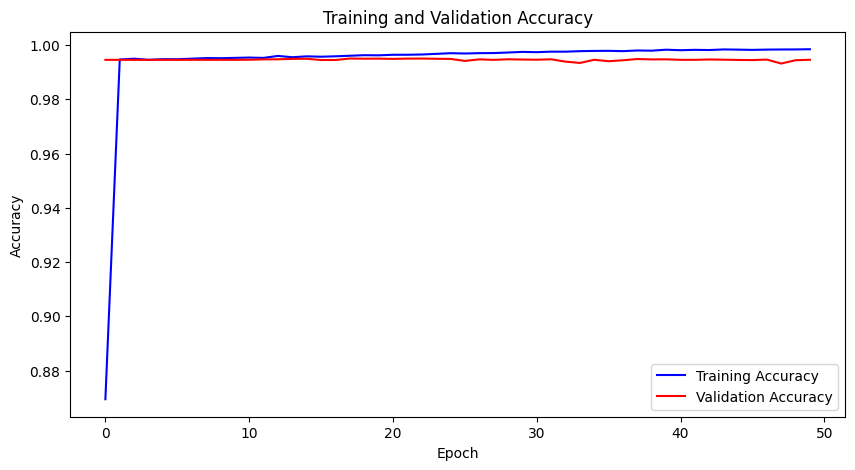

In [225]:
# Plot training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.plot(val_accuracy, label='Validation Accuracy', color='red')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [226]:
import os
import time
import matplotlib.pyplot as plt
import tensorflow as tf

def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask

def show_predictions(dataset, num=1):
    # Use home directory if scratch is problematic
    #parent_dir = os.path.expanduser("~/Segmentation_results")
    parent_dir = os.path.abspath("/scratch/xxsi3290/Kaggle/Segmentation_results")
    file_time = time.strftime('%Y%m%d_%H%M%S')
    output_directory = os.path.join(parent_dir, f"{file_time}_new_UNET_Segmentation")

    if not os.path.exists(output_directory):
        os.makedirs(output_directory)
        print(f"Created directory: {output_directory}")
    else:
        print(f"Saving to existing directory: {output_directory}")

    sample_id = 0

    for images, masks in dataset.take(num):
        print(f"Processing batch with {images.shape[0]} samples...")
        pred_masks = model.predict(images)

        for i in range(images.shape[0]):
            input_img = images[i]
            true_mask = masks[i]
            pred_mask = create_mask(pred_masks[i][tf.newaxis, ...])[0]

            fig, axs = plt.subplots(1, 3, figsize=(12, 4))

            axs[0].imshow(tf.keras.utils.array_to_img(input_img))
            axs[0].set_title("Input Image")
            axs[0].axis('off')

            axs[1].imshow(tf.squeeze(true_mask), cmap='gray')
            axs[1].set_title("Ground Truth")
            axs[1].axis('off')

            axs[2].imshow(tf.squeeze(pred_mask), cmap='gray')
            axs[2].set_title("Predicted Mask")
            axs[2].axis('off')

            # Save figure
            save_path = os.path.join(output_directory, f"sample_{sample_id}.png")
            plt.tight_layout()
            plt.savefig(save_path)
            plt.close(fig)

            print(f"Saved: {save_path}")
            sample_id += 1
    
    # === Step 2: Calculate overall metrics ===
    overall_train_loss = np.mean(train_loss)
    overall_train_accuracy = np.mean(train_accuracy)
    overall_val_loss = np.mean(val_loss)
    overall_val_accuracy = np.mean(val_accuracy)

    # === Step 3: Save metrics to a text file ===
    metrics_text_path = os.path.join(output_directory, "overall_metrics.txt")
    with open(metrics_text_path, "w") as f:
        f.write("=== UNet Training Summary ===\n")
        f.write(f"Overall Training Loss: {overall_train_loss:.4f}\n")
        f.write(f"Overall Training Accuracy: {overall_train_accuracy:.4f}\n")
        f.write(f"Overall Validation Loss: {overall_val_loss:.4f}\n")
        f.write(f"Overall Validation Accuracy: {overall_val_accuracy:.4f}\n")
    print(f"Saved overall metrics to {metrics_text_path}")

    # === Step 4: Save Training & Validation Loss Plot ===
    plt.figure(figsize=(10, 5))
    plt.plot(train_loss, label='Training Loss', color='blue')
    plt.plot(val_loss, label='Validation Loss', color='red')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    loss_plot_path = os.path.join(output_directory, "loss_plot.png")
    plt.savefig(loss_plot_path)
    plt.close()
    print(f"Saved loss plot to {loss_plot_path}")

    # === Step 5: Save Training & Validation Accuracy Plot ===
    plt.figure(figsize=(10, 5))
    plt.plot(train_accuracy, label='Training Accuracy', color='blue')
    plt.plot(val_accuracy, label='Validation Accuracy', color='red')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    acc_plot_path = os.path.join(output_directory, "accuracy_plot.png")
    plt.savefig(acc_plot_path)
    plt.close()
    print(f"Saved accuracy plot to {acc_plot_path}")

In [227]:
show_predictions(test_dataset, num=1)

Created directory: /scratch/xxsi3290/Kaggle/Segmentation_results/20250508_121353_new_UNET_Segmentation
Processing batch with 32 samples...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
Saved: /scratch/xxsi3290/Kaggle/Segmentation_results/20250508_121353_new_UNET_Segmentation/sample_0.png
Saved: /scratch/xxsi3290/Kaggle/Segmentation_results/20250508_121353_new_UNET_Segmentation/sample_1.png
Saved: /scratch/xxsi3290/Kaggle/Segmentation_results/20250508_121353_new_UNET_Segmentation/sample_2.png
Saved: /scratch/xxsi3290/Kaggle/Segmentation_results/20250508_121353_new_UNET_Segmentation/sample_3.png
Saved: /scratch/xxsi3290/Kaggle/Segmentation_results/20250508_121353_new_UNET_Segmentation/sample_4.png
Saved: /scratch/xxsi3290/Kaggle/Segmentation_results/20250508_121353_new_UNET_Segmentation/sample_5.png
Saved: /scratch/xxsi3290/Kaggle/Segmentation_results/20250508_121353_new_UNET_Segmentation/sample_6.png
Saved: /scratch/xxsi3290/Kaggle/Segmentation_results/20250508_121353_new_UNET_Segmentation/sam